In [2]:
import os
import re 
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from string import punctuation
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
#Initialize NLTK
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')


In [3]:
#Initialize NLTK
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')



[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [ ]:
#preprocessed_text , out_put text ：DateSet
from string import punctuation
punctuation_list = list(punctuation) # Convert punctuation to a list
#number+letter
punctuation_list.append("''")
punctuation_list.append('``')
punctuation_list.append("-")
punctuation_list.append('.')
hyperlink_pattern = r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+'

words_lowercase = []
#delete symbols ,like this �
def remove_non_ascii(text):
    return re.sub(r'^[a-zA-Z0-9]+$', '', text)
#define preprocessing functions
def preprocess_text(text):
    #Punctuation Removal 1
    text = re.sub(r'[^a-zA-Z0-9 ]', '', text)
    #no_hyperlinks
    text_no_hyperlinks = re.sub(hyperlink_pattern,'',text)
    #Word Tokenization
    tokens = word_tokenize(text_no_hyperlinks)
    #Lower_casing
    tokens_lower = [token.lower() for token in tokens]
    #Stop Words Removal
    stop_words = set(stopwords.words('english'))
    tokens_stopwords = [token for token in tokens_lower if token not in stop_words]
 
    processed_text = " ".join(tokens_stopwords)
    return processed_text
'''Convert Penn Treebank POS tags to WordNet'''
def penn_to_wordnet(penn_pos_tag):
    tag_dictionary = {'NN':'n', 'JJ':'a','VB':'v', 'RB':'r'}
    try:
        # If the first two characters of the Penn Treebank POS tag are in the ``tag_dictionary''
        return tag_dictionary[penn_pos_tag[:2]]
    except:
        return 'n' # Default to Noun if no mapping avalable.

directory_path = 'F:/durham/MDS/Project/Data'
total_txt_files = 0
output_directory = 'F://durham//MDS//Project//DatasetPre2'

# Ensure the output directory exists
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

#Load WordNet Lemmatizer
lemmatizer = WordNetLemmatizer()

try:
    # List all files in the directory
    file_list = os.listdir(directory_path)
    # Process each file in the directory
    for file_name in file_list:
        if file_name.lower().endswith('.txt'):
            file_path = os.path.join(directory_path, file_name)
            output_file_path = os.path.join(output_directory, file_name)
            #txt number
            total_txt_files += 1
            print(f"File:{file_name}")
            with open(file_path,"r",encoding='utf-8',errors='replace') as file:
                content = file.read()
                cleaned_content = remove_non_ascii(content) #如果不搞会报错
            processed_text = preprocess_text(cleaned_content)
            #Tokenize the preprocessed text
            tokens = word_tokenize(processed_text)
            #Perform POS tagging
            pos_tags = pos_tag(tokens)
            #Lemmatized with Pos tagging
            lemmatized_tokens = [lemmatizer.lemmatize(word,penn_to_wordnet(tag)) for word, tag in pos_tags]
            processed_text_lemmatization = " ".join(lemmatized_tokens)
            # Save the processed text to a new file
            with open(output_file_path, 'w', encoding='utf-8') as file:
                file.write(processed_text_lemmatization)


except FileNotFoundError:
    print("Error: The directory was not found.")
except IOError:
    print("Error: Unable to read files in the directory.")
print("Total number of text files read:", total_txt_files)


File:'Turning' everywhere in IR on the sociological underpinnings of the field's proliferating turns.txt
File:A current literature review of international mediation.txt
File:A Divided Discipline Mapping Peace and Conflict Studies.txt
File:Agreement Without Peace International Mediation and Time Inconsistency Problems.txt
File:Assessing Context-Specific Peacebuilding Approaches in Contemporary Armed Conflicts From High-Level Mediation to Middle-Out Linkage in Syria and from Adaptive Mediation to Nationally-Owned Peacebuilding in Mozambi.txt
File:Barriers to Coordination Examining the Impact of Culture on International Mediation Occurrence and Effectiveness.txt


KeyboardInterrupt: 

In [ ]:
#Store in CSV file
import os 
import csv
import re
import pandas as pd
import shutil

def remove_non_ascii(text):
    pattern = r'[^a-zA-Z0-9\n\s]'
    return re.sub(pattern, '', text)
def find_year(text):
    numbers = re.findall(r'\d+', text)
    for number in numbers:
        if len(number) >=4 and int(number) > 1325:#因为有一篇文章的标题带有1325，会先找到这四个数字
            return number
    return None
#special article
def find_third_txt(text):
    numbers = re.findall(r'\d+', text)
    #Find the third numbers
    count = 0
    for number in numbers:
        if len(number) >=4 :
            count += 1 
            if count == 3:
                return number
    return None

txt_directory = 'F:/durham/MDS/Project/Dataset'
output_folder_path = 'F:/durham/MDS/Project/Data'

article_names = []
publication_years = []
file_names = []
article_content = []

def process_txt_files(txt_directory, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    for filename in os.listdir(txt_directory):
        if filename.endswith('.txt'):
            txt_path = os.path.join(txt_directory, filename)
        
            with open(txt_path, 'r', encoding='utf-8', errors='replace') as txt_file : 

                content = txt_file.read()
                cleaned_content = remove_non_ascii(content)
                lines = cleaned_content.split('\n')
                article_name = None
                year_of_publication = None
            
            #article_name
                if len(lines) > 0:
                    article_name = lines[0].strip()
            #publication year
                if filename == 'True, J. and Riveros-Morales, Y. .txt':
                    year_of_publication = find_third_txt(content)
                else:    
                    year_of_publication = find_year(content)
            #full_text       
                content_without_metadata = cleaned_content.replace(article_name, '').replace(year_of_publication, '')

                output_file_path = os.path.join(output_folder, filename)
                with open(output_file_path, 'w') as output_file:
                    output_file.write(content_without_metadata)
                    
                print(f"Processed {filename}. Extracted content saved in {output_file_path}\n")
            
                if article_name:
                    file_names.append(filename)
                    article_names.append(article_name)
                    publication_years.append(year_of_publication)
                    article_content.append(content_without_metadata)
                  
                    
                
process_txt_files(txt_directory, output_folder_path)


Processed 'Turning' everywhere in IR on the sociological underpinnings of the field's proliferating turns.txt. Extracted content saved in F:/durham/MDS/Project/Data\'Turning' everywhere in IR on the sociological underpinnings of the field's proliferating turns.txt

Processed A current literature review of international mediation.txt. Extracted content saved in F:/durham/MDS/Project/Data\A current literature review of international mediation.txt

Processed A Divided Discipline Mapping Peace and Conflict Studies.txt. Extracted content saved in F:/durham/MDS/Project/Data\A Divided Discipline Mapping Peace and Conflict Studies.txt

Processed Agreement Without Peace International Mediation and Time Inconsistency Problems.txt. Extracted content saved in F:/durham/MDS/Project/Data\Agreement Without Peace International Mediation and Time Inconsistency Problems.txt

Processed Assessing Context-Specific Peacebuilding Approaches in Contemporary Armed Conflicts From High-Level Mediation to Middle-

In [ ]:
#Save the file name, title, and author to a CSV file first
data = {'File Name':file_names,'Article Name': article_names, 'Year of Publication': publication_years}
df = pd.DataFrame(data)
#print(df)

#Define CSV file path
output_file_csv = 'F://durham//MDS//Project//dataset1.csv'
df.to_csv(output_file_csv, index=False)

print(f"DataFrame has been saved to {output_file_csv}")

DataFrame has been saved to F://durham//MDS//Project//dataset1.csv


In [ ]:
import os
import csv
#Split large files
def split_content(content, part_length):
    #return [content[i:i+part_length] for i in range(0, len(content), part_length)]
    parts = []
    words = content.split()
    current_part = '' 
    
    for word in words:
#Check if the length of the current part is less than or equal to the length of the word to be added and the total length of a space is less than or equal to the set part_ Length.
        if len(current_part) + len(word) + 1 <= part_length: 
#check null
            if current_part:
#This ensures that there is a space separating words.
                current_part += ' ' + word
            else:
                current_part = word
        else:
            parts.append(current_part)
            current_part = word
    
    if current_part:
        parts.append(current_part)
    
    return parts




#Place the split content into a CSV file
def save_csv(input_folder, output_csv_file, max_cols, part_length):
    with open(output_csv_file, 'w', newline='', encoding='utf-8',errors='replace') as csv_file:
        csv_writer = csv.writer(csv_file)
        csv_writer.writerow(['Filename'] + [f'Content_Part_{i}' for i in range(1, max_cols + 1)])  # 写入CSV文件的列名

        for filename in os.listdir(input_folder):
            if filename.endswith('.txt'):
                file_path = os.path.join(input_folder, filename)
                
                with open(file_path, 'r', encoding='utf-8') as file:
                    content = file.read()
                    content_parts = split_content(content, part_length)
               
                

# If the split part of a certain article is less than max_ Cols column, the remaining columns will be filled with empty strings.
                
                row = [filename] + content_parts + [''] * (max_cols - len(content_parts))
                csv_writer.writerow(row)
                

input_folder_path = 'F://durham//MDS//Project//DatasetPre2'
output_csv_file_path = 'F://durham//MDS//Project//dataset2.csv'
part_length = 32700  
max_cols = 16
save_csv(input_folder_path, output_csv_file_path,max_cols ,part_length)


Number of articles in the year range 1985-1992: 10
Number of articles in the year range 1993-2000: 10
Number of articles in the year range 2001-2008: 22
Number of articles in the year range 2009-2016: 51
Number of articles in the year range 2017-2023: 76


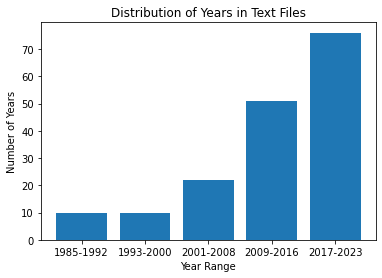

In [ ]:
#Create a year table

import matplotlib.pyplot as plt
from collections import Counter
def find_year(text):
    numbers = re.findall(r'\d+', text)
    for number in numbers:
        if len(number) >=4 and int(number) > 1325:
            return number
    return None


def find_third_txt(text):
    numbers = re.findall(r'\d+', text)
    #Find the third numbers
    count = 0
    for number in numbers:
        if len(number) >=4 :
            count += 1 
            if count == 3:
                return number
    return None


def read_txts(directory_path):
    years_files = []
    for file_name in os.listdir(directory_path):
        file_path = os.path.join(directory_path, file_name)
        with open(file_path , 'r' , encoding='utf-8') as file:
            content = file.read()
         
            if file_name == 'True, J. and Riveros-Morales, Y. .txt':
                year = find_third_txt(content)
            else:
                year = find_year(content)
            if year:
                years_files.append((int(year),file_name))
    return years_files


def divide_year(sorted_years, num_parts):
    min_year = sorted_years[0]
    max_year = sorted_years[-1]
    total_years = max_year - min_year + 1
    step = total_years // num_parts
    remainder = total_years % num_parts
    
    year_ranges = []
    start_year = min_year

    for i in range(num_parts):
        end_year = start_year + step - 1
        if remainder > 0:
            end_year += 1
            remainder -= 1
        year_ranges.append((start_year, end_year))
        start_year = end_year + 1   
    return year_ranges

years_and_files = read_txts(output_directory)

#Get the list of years
years = []
for year, _ in years_and_files :
    years.append(year)



num_parts = 5

year_ranges = divide_year(sorted_years , num_parts)

year_counter = Counter(years)

#Calculate the number of years in each part
number_years = []
for start, end in year_ranges:
    # Use list comprehension to create a list of counts for each year in the range from start to end (inclusive)
    counts = [year_counter[i] for i in range(start , end +1)]
    #Calculate the sum of counts in the list to get the total number of articles for the current year range
    total_articles = sum(counts)
    # Append the total number of articles to the number_years list
    number_years.append(total_articles)
    

for i, (start, end) in enumerate(year_ranges):
    print(f"Number of articles in the year range {start}-{end}: {number_years[i]}")
#Plottng the graph
plt.bar(range(len(year_ranges)), number_years, tick_label=[f"{start}-{end}" for start, end in year_ranges])
plt.xlabel("Year Range")
plt.ylabel("Number of Years")
plt.title("Distribution of Years in Text Files")
plt.show()




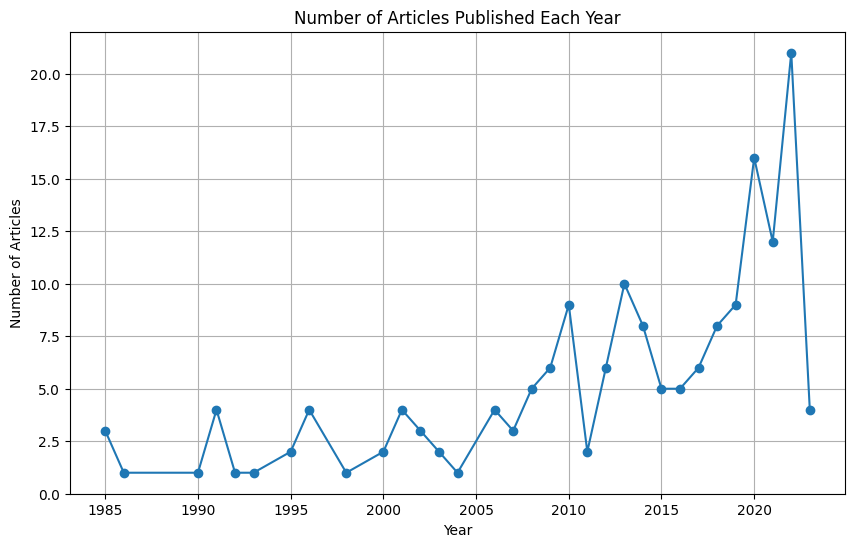

In [231]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a DataFrame
dfyear = pd.read_csv('dataset.csv')

# Group the data by 'Year' and count the number of articles for each year
count_by_year = dfyear.groupby('Year of Publication').size()

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(count_by_year.index, count_by_year.values, marker='o')
plt.xlabel('Year')
plt.ylabel('Number of Articles')
plt.title('Number of Articles Published Each Year')
plt.grid(True)
plt.show()


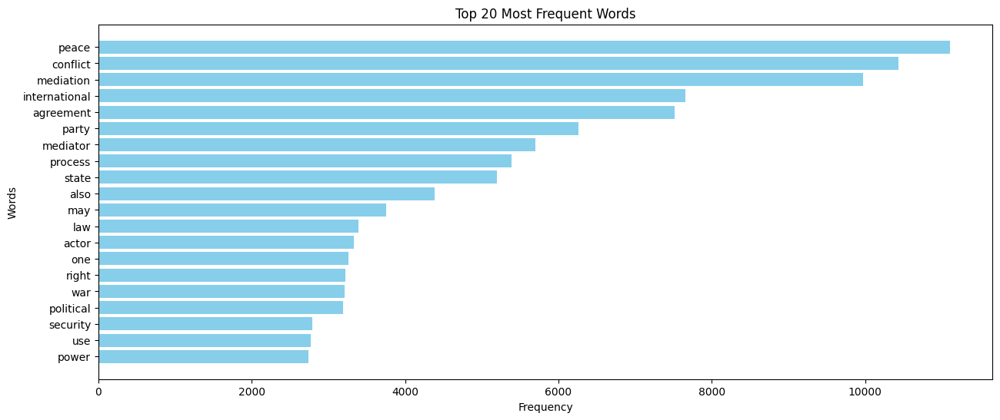

In [232]:
all_text = ' '.join(df['Content_Part_1'])  # Replace 'Your_Column_Name' with the actual column name containing the text
stop_words = set(stopwords.words('english'))
words = all_text.lower().split()
filtered_words = [word for word in words if word not in stop_words]
word_counts = Counter(filtered_words)
most_common_words = word_counts.most_common(20)  # Replace 20 with the number of words you want to display
words = [word[0] for word in most_common_words]
counts = [word[1] for word in most_common_words]

plt.figure(figsize=(15, 6))
plt.barh(words, counts, color='skyblue')
plt.xlabel('Frequency')
plt.ylabel('Words')
plt.title('Top 20 Most Frequent Words')
plt.gca().invert_yaxis()
plt.show()


d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



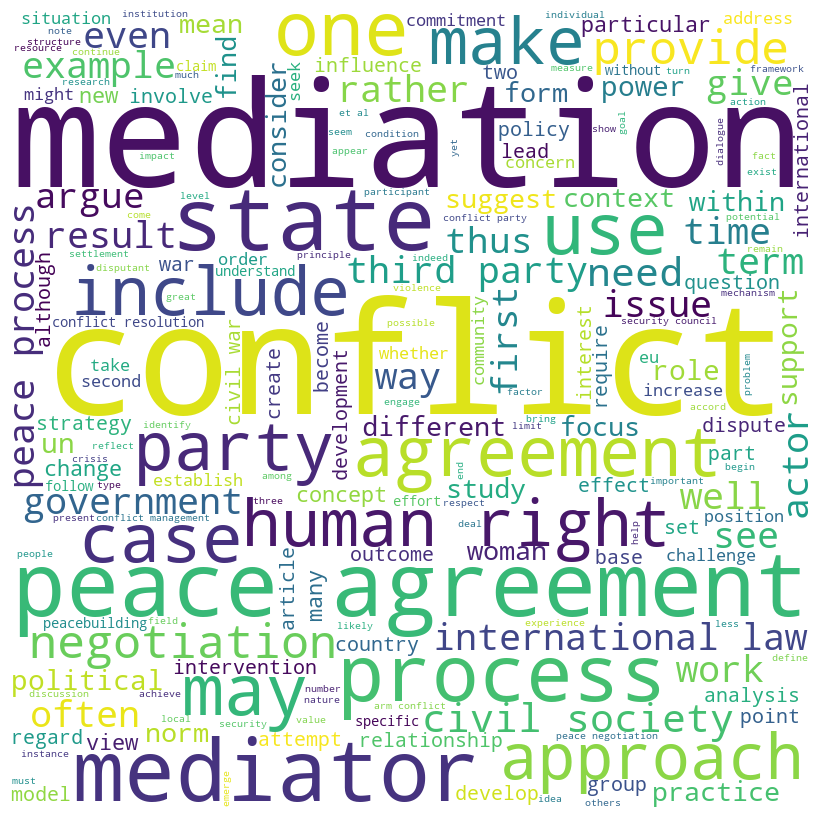

In [236]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pandas as pd



# Concatenate text data to a single string
cloud_text = ' '.join(df['Content_Part_1'])

# Generate the wordcloud as before
wordcloud = WordCloud(width=800, height=800, background_color="white", colormap="viridis",contour_width=3, contour_color='steelblue').generate(cloud_text)

# Display the generated image:
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)

plt.show()




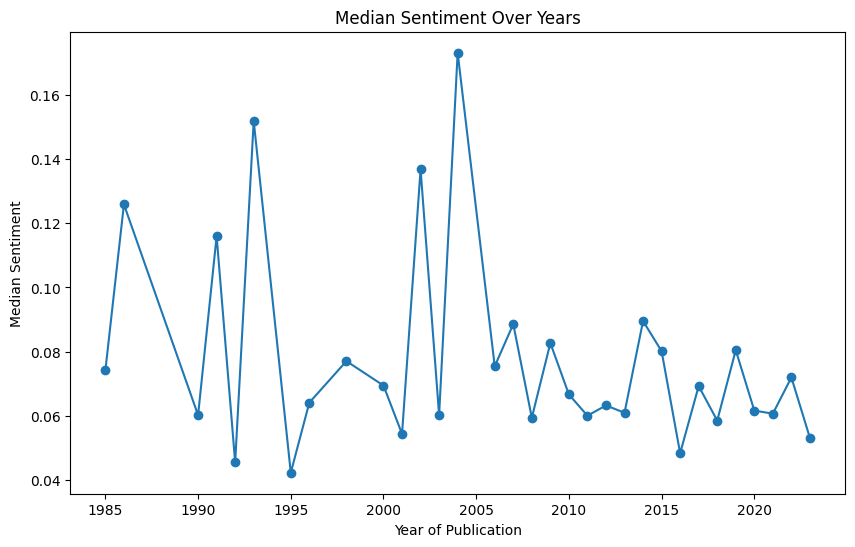

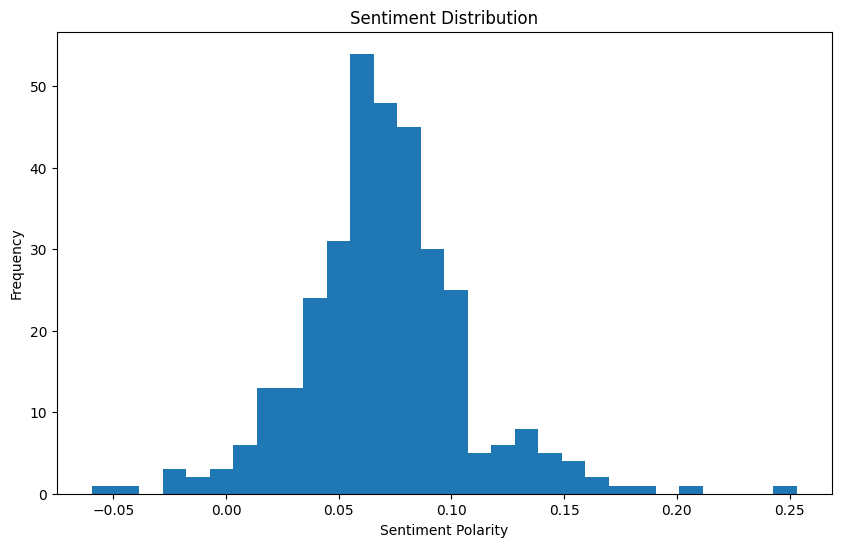

In [261]:
import pandas as pd
import matplotlib.pyplot as plt
from textblob import TextBlob

df['sentiment'] = df['Content_Part_1'].apply(lambda x: TextBlob(str(x)).sentiment.polarity)
# a 'year' column and want to aggregate by year
#grouped_df = df.groupby('Year of Publication')['sentiment'].mean().reset_index() #mean is not good
grouped_df = df.groupby('Year of Publication')['sentiment'].median().reset_index()#median


#sentiment by year
plt.figure(figsize=(10,6))
plt.plot(grouped_df['Year of Publication'], grouped_df['sentiment'], marker='o')
plt.title('Median Sentiment Over Years')
plt.xlabel('Year of Publication')
plt.ylabel('Median Sentiment')
plt.show()


# haven't aggregated the data
plt.figure(figsize=(10,6))
plt.hist(df['sentiment'], bins=30)
plt.title('Sentiment Distribution')
plt.xlabel('Sentiment Polarity')
plt.ylabel('Frequency')
plt.show()


In [ ]:
#Text-representation
nltk.download('gutenberg')
from nltk.corpus import gutenberg

## LDA

In [5]:
from gensim import corpora,models
from gensim.models import LdaModel

d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\gensim\similarities\__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


In [6]:
import pandas as pd

csv_file = "f:/durham/MDS/Project/dataset_test1.csv"
df = pd.read_csv(csv_file, low_memory = False)#防止弹出警告

df.head(3)
df1 = df['Content_Part_1']
print(df1)


0      abstract purpose rapidly expand body literatur...
1      abstractscholars field peace conflict study lo...
2      abstractmediation compete short longterm effec...
3      abstractas contemporary arm conflict become in...
4      abstractculture feature prominently literature...
                             ...                        
328    forwardlooking build culture diversity equal c...
329    country credible verifiable information 2019 s...
330    become widely accepted usage range instrument ...
331    fail ec become replaced un peace keep role pea...
332    incompatible stabilization goalsfootnote150in ...
Name: Content_Part_1, Length: 333, dtype: object


In [7]:
import nltk
from nltk.tokenize import word_tokenize
import pandas as pd

# tokenize_text
def tokenize_text(text):
    if isinstance(text, str):  # If it is a string, perform word segmentation
        return word_tokenize(text)
    else:  # If it is a different data type, return an empty list
        return []

tokenized_texts = []
for row in df1:
    tokenized_texts.append(tokenize_text(row))

# Remove empty segmentation results and add the tag list to the new list
tokenized_text = [tokens for tokens in tokenized_texts if tokens]


In [189]:
#LDA
import pandas as pd
from gensim import corpora,models

wordDict = corpora.Dictionary(tokenized_text)
corpus = [wordDict.doc2bow(text) for text in tokenized_text]

tfidf_model = models.TfidfModel(corpus)
corpus_tfidf = tfidf_model[corpus]
corpus_tfidf
#LDA model
from gensim.models.ldamodel import LdaModel

%time ldamodel = LdaModel(corpus, id2word = wordDict, num_topics = 13, passes = 5, alpha = 5,eta = 0.1)
ldamodel = LdaModel(corpus, id2word = wordDict, num_topics = 13, passes = 5, alpha = 5,eta = 0.1)


#Lda Model Visualization
import pyLDAvis.gensim
pyLDAvis.enable_notebook
topic_data = pyLDAvis.gensim.prepare(ldamodel,corpus_tfidf,wordDict)
pyLDAvis.display(topic_data)

CPU times: total: 1min 3s
Wall time: 56.3 s


In [191]:
#Save the results as this HTML file
pyLDAvis.save_html(topic_data, 'lda_numtopics13.html')	# numtopics = 13



In [ ]:
ldamodel = LdaModel(corpus, num_topics = 10, id2word = wordDict, passes=30,random_state = 200, iterations = 100)
# ldamodel.show_topics(num_words=15) 
# topics = ldamodel.print_topics(num_words=15)
# for topic in topics:
#     print(topic)
print(ldamodel.print_topics(num_topics=10, num_words=15))  #print 15 topics 

[(0, '0.000*"mediation" + 0.000*"peacebuilding" + 0.000*"un" + 0.000*"conflict" + 0.000*"peace" + 0.000*"actor" + 0.000*"crisis" + 0.000*"mediator" + 0.000*"agreement" + 0.000*"international" + 0.000*"approach" + 0.000*"state" + 0.000*"also" + 0.000*"process" + 0.000*"party"'), (1, '0.024*"mediation" + 0.017*"crisis" + 0.015*"agreement" + 0.012*"conflict" + 0.010*"mediator" + 0.008*"actor" + 0.008*"time" + 0.007*"variable" + 0.007*"cost" + 0.007*"use" + 0.006*"information" + 0.006*"model" + 0.005*"peace" + 0.005*"dyad" + 0.005*"also"'), (2, '0.000*"peace" + 0.000*"conflict" + 0.000*"mediation" + 0.000*"peacebuilding" + 0.000*"civil" + 0.000*"state" + 0.000*"society" + 0.000*"also" + 0.000*"party" + 0.000*"mediator" + 0.000*"un" + 0.000*"international" + 0.000*"agreement" + 0.000*"approach" + 0.000*"resolution"'), (3, '0.024*"mediation" + 0.014*"conflict" + 0.010*"mediator" + 0.008*"intervention" + 0.008*"study" + 0.007*"agreement" + 0.007*"io" + 0.007*"party" + 0.006*"international" + 

# BERT+DTM


In [8]:

df["Year of Publication"].value_counts()

Year of Publication
2022    45
2020    25
2021    23
2008    22
2015    21
2010    17
2013    17
2003    16
2018    15
2019    14
2014    12
2017    12
2012    10
2009     9
2023     8
2006     8
2016     8
1996     7
2001     7
1991     6
2002     5
2007     4
1985     4
2000     4
1995     3
2004     2
1992     2
2011     2
1998     2
1990     1
1986     1
1993     1
Name: count, dtype: int64

In [9]:
from gensim import corpora

In [10]:
import pandas as pd

csv_file = "f:/durham/MDS/Project/dataset_test1.csv"
csv_data = pd.read_csv(csv_file, low_memory = False)# warning
df = pd.DataFrame(csv_data)
df1 = df['Content_Part_1']
print(df1)

0      abstract purpose rapidly expand body literatur...
1      abstractscholars field peace conflict study lo...
2      abstractmediation compete short longterm effec...
3      abstractas contemporary arm conflict become in...
4      abstractculture feature prominently literature...
                             ...                        
328    forwardlooking build culture diversity equal c...
329    country credible verifiable information 2019 s...
330    become widely accepted usage range instrument ...
331    fail ec become replaced un peace keep role pea...
332    incompatible stabilization goalsfootnote150in ...
Name: Content_Part_1, Length: 333, dtype: object


In [11]:
import nltk
from nltk.tokenize import word_tokenize
import pandas as pd

# tokenize_text
def tokenize_text(text):
    if isinstance(text, str): 
        return word_tokenize(text)
    else:  
        return []

tokenized_texts = []
for row in df1:
    tokenized_texts.append(tokenize_text(row))


tokenized_text = [tokens for tokens in tokenized_texts if tokens]


In [12]:
#End data acquisition and data preprocessing
#1.3 Text vectorization
from gensim.corpora import Dictionary
from gensim.models import TfidfModel

##Building a Word Bag Model
#worddict
wordDict  = corpora.Dictionary(tokenized_text)
#corpus
corpus = [wordDict.doc2bow(doc) for doc in tokenized_text]
#print(corpus_bow[:2])  
#tfidf
#cn_corpus_tfidf[0]
tfidf_model = TfidfModel(corpus)
corpus_tfidf = tfidf_model[corpus]
#print(list(corpus_tfidf)[:2])  

### DTM主题模型

In [14]:
#DTM model
from gensim.models import ldaseqmodel
#Ten years per cycle
time_slice = [5,22,77,128,101]  #count of articles



333


In [15]:
from gensim.models.coherencemodel import CoherenceModel

In [16]:
texts = df["Content_Part_1"].apply(lambda text: text.split())  

# The text here is a Series that contains text data after word segmentation

data_set = texts.tolist()
print(type(data_set))

<class 'list'>


In [ ]:
#Confusion and consistency
import gensim
from gensim import corpora, models


def lda_model_values(num_topics, corpus, wordDict):
    x = [] 
    perplexity_values = [] # Confusion
    coherence_values = []   # consistency
    model_list = [] 

    for topic in range(num_topics):
        print("Topic Number：", topic+1)
        lda_model = models.LdaModel(corpus=corpus, num_topics=topic+1, id2word =wordDict, chunksize = 2000, passes=20, iterations = 400)
        model_list.append(lda_model)
        x.append(topic+1)
        perplexity_values.append(lda_model.log_perplexity(corpus))

        coherencemodel = models.CoherenceModel(model=lda_model, texts=tokenized_text, dictionary=wordDict, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())
        print("Finish\n")
    return model_list, x, perplexity_values, coherence_values
    


In [ ]:
import matplotlib.pyplot as plt
import matplotlib
from pylab import xticks,yticks,np
num_topics = 20

# Call preparation function
model_list, x, perplexity_values, coherence_values = lda_model_values(num_topics, corpus, wordDict) 

# Draw a line chart of confusion and consistency
fig = plt.figure(figsize=(15,5))
plt.rcParams['font.sans-serif']=['SimHei']
matplotlib.rcParams['axes.unicode_minus'] = False 


ax1 = fig.add_subplot(1, 2, 1)
plt.plot(x, perplexity_values, marker="o")
plt.title("Confusion")
plt.xlabel('Topic Number')
plt.ylabel('Confusion Size')
xticks(np.linspace(1, num_topics, num_topics, endpoint=True)) 



ax2 = fig.add_subplot(1, 2, 2)
plt.plot(x, coherence_values, marker="o")
plt.title("Topic Modeling - Coherence")
plt.xlabel("Topic Number")
plt.ylabel("Coherence")
xticks(np.linspace(1, num_topics, num_topics, endpoint=True))


plt.show()



In [17]:
#DTM
ldaseq_model = ldaseqmodel.LdaSeqModel(corpus=corpus, num_topics=13, id2word=wordDict, time_slice=time_slice) 
#doc = ldaseq_model.doc_topics(0)
#print(doc)


d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\gensim\models\ldaseqmodel.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  convergence = np.fabs((bound - old_bound) / old_bound)


### 3.BERT语义特征向量

In [18]:
import transformers
import numpy as np

d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [19]:
import torch 
print(torch.__version__)    
print("gpu", torch.cuda.is_available())  #False

2.0.1+cpu
gpu False


In [20]:
#3.1loading bert-base-uncased
from transformers import BertTokenizer, BertModel
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained("bert-base-uncased")

#Initialize an array to store sentence vectors
#Generate semantic feature representations of text, or rather sentence vectors v_ Output
v_output = []


for text in df["Content_Part_1"]:
    inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True)
    
    # output

    with torch.no_grad():

        outputs = model(**inputs)
    sentence_vector = outputs.last_hidden_state[:, 0, :].numpy()
    v_output.append(sentence_vector)
    

# Convert sentence vectors into NumPy arrays
v_output = np.array(v_output)
v_output = np.squeeze(v_output, axis=1) 
print(inputs)

In [21]:
#Initialize an array to store sentence vectors
#Generate semantic feature representations of text, or rather sentence vectors v_ Output
v_output = []


for text in df["Content_Part_1"]:
    inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True)
    
    # output

    with torch.no_grad():

        outputs = model(**inputs)
    sentence_vector = outputs.last_hidden_state[:, 0, :].numpy()
    v_output.append(sentence_vector)
    

# Convert sentence vectors into NumPy arrays
v_output = np.array(v_output)
v_output = np.squeeze(v_output, axis=1) 
print(inputs)

print(v_output)

{'input_ids': tensor([[  101, 25876, 28715,  3289, 13064, 22074, 16068,  2692,  2378,  2422,
          3332,  4495,  6543, 23382,  8735,  3749, 14203, 16114,  2308,  2015,
          6577, 19905,  3521,  8335, 15945,  2104,  2890, 28994, 19304,  2812,
          3114, 11268,  7512,  4894,  6685,  2196,  6148,  2525, 15536, 14273,
          2373, 20951,  6148,  2443, 13064, 22074, 16068,  2487,  2705,  9910,
          3114,  4703, 20865, 10502,  2450,  3653,  3567,  4014, 10599,  2653,
          5670,  2034,  3114,  2411,  2507,  2450,  5589,  4736,  5813,  2525,
          2035, 12672,  2450,  8100, 27617, 11244,  2729, 26096,  3521, 14301,
          2075,  2947,  2204,  3521, 13064, 22074, 16068,  2475,  4366,  2089,
          2191,  2171,  2388,  9021, 13064, 22074, 16068,  2509,  2735,  4132,
          3921,  5574,  3928,  2273, 13064, 22074, 16068,  2549,  6827,  2923,
          4145,  6897, 28283, 25300,  6491,  2036,  6118,  5049, 17537,  3978,
          4053,  2450, 19444,  2015,  

In [25]:
print(outputs.last_hidden_state.shape)#torch.Size([1, 512, 768])


torch.Size([1, 512, 768])


In [26]:
#Generate semantic feature representations, or sentence vectors, of text
v_output

array([[-0.60739464,  0.4257568 ,  0.05077035, ..., -0.5205624 ,
         0.2012503 ,  0.00421313],
       [-0.3747706 ,  0.37125114,  0.0733896 , ..., -0.55096465,
         0.25241938,  0.30035874],
       [-0.68619895,  0.20496511,  0.19893377, ..., -0.46666595,
         0.24970755,  0.1857918 ],
       ...,
       [-0.36139515,  0.06769927,  0.2158075 , ..., -0.4426    ,
        -0.07362722,  0.30649763],
       [-0.40177152, -0.01436326,  0.233542  , ..., -0.31428963,
         0.10534998,  0.22201313],
       [-0.25672844,  0.2396352 ,  0.10902932, ..., -0.26392218,
         0.06469848,  0.16930437]], dtype=float32)

### 4 BERT+DTM 语义关联聚类及其可视化


In [27]:
#4.1 Document Topic Probability Matrix Acquisition
import numpy as np
#topics = np.array(sim)

# Obtain the topic probability matrix of the document
document_topic_prob_matrix = []
for doc_bow in corpus:
    topic_prob = ldaseq_model[doc_bow]  # Obtain the probability of documents on various topics
    document_topic_prob_matrix.append(topic_prob)


# Convert list to NumPy array (matrix)
document_topic_prob_matrix = np.array(document_topic_prob_matrix)

print(document_topic_prob_matrix)

[array([0.00105827, 0.05260386, 0.0281128 , 0.00446378, 0.00562603,
       0.007722  , 0.00263789, 0.00699524, 0.01193712, 0.00319769,
       0.0015413 , 0.87106013, 0.0030439 ]), array([0.01374113, 0.04843243, 0.00155706, 0.03087811, 0.02194824,
       0.00175441, 0.00195827, 0.00734351, 0.74947427, 0.0315346 ,
       0.00119029, 0.0891822 , 0.00100549]), array([7.33440833e-04, 1.51080797e-02, 5.44485874e-02, 4.73094716e-03,
       2.32507672e-03, 1.83671572e-02, 2.40377104e-06, 1.11771329e-02,
       1.34632902e-02, 1.59582447e-02, 3.24059878e-03, 8.55847843e-01,
       4.59719730e-03]), array([0.43570273, 0.01444319, 0.0301027 , 0.33735633, 0.00246222,
       0.01966251, 0.01324989, 0.00504137, 0.06804419, 0.0179227 ,
       0.01739484, 0.02220107, 0.01641627]), array([2.42123129e-06, 2.90244102e-02, 7.48165720e-03, 1.44957030e-03,
       5.11941640e-03, 2.42123129e-06, 1.36456550e-02, 1.68918339e-01,
       2.42123129e-06, 2.34952851e-01, 2.42123129e-06, 5.39395995e-01,
       2.42

In [28]:
print(type(document_topic_prob_matrix))#list

# Convert list to NumPy array (matrix)
document_topic_prob_matrix = np.array(document_topic_prob_matrix)

print(document_topic_prob_matrix)


<class 'list'>
[[1.05827422e-03 5.26038605e-02 2.81127970e-02 ... 1.54130364e-03
  8.71060127e-01 3.04389947e-03]
 [1.37411294e-02 4.84324263e-02 1.55706304e-03 ... 1.19028541e-03
  8.91821986e-02 1.00548744e-03]
 [7.33440833e-04 1.51080797e-02 5.44485874e-02 ... 3.24059878e-03
  8.55847843e-01 4.59719730e-03]
 ...
 [1.35146784e-02 3.00018301e-06 4.68321617e-04 ... 9.13694176e-01
  3.00018301e-06 1.35318336e-02]
 [1.11763970e-02 2.22964621e-02 1.86662835e-02 ... 3.28283907e-03
  8.99481129e-03 8.44815875e-01]
 [1.76182968e-02 1.71024796e-02 2.10867306e-03 ... 8.57746278e-01
  4.71436840e-03 1.84370663e-02]]


In [29]:
#4.2 Topic vector and BERT vector connection

import numpy as np
import pandas as pd
from keras.layers import Input, Dense, Concatenate
from keras.models import Model
from sklearn.decomposition import PCA #Dimensionality reduction


从你提供的数据可以看出，你的数据是一个矩阵，其中每一行表示一个文档，每一列表示一个主题，每个元素表示文档在对应主题上的概率。在这种情况下，.mean(axis=0) 操作将会计算每个主题在所有文档中的平均概率分布。

具体来说，document_topic_prob_matrix.mean(axis=0) 将会计算每个主题的平均概率分布，结果将是一个包含各个主题平均概率的数组。这有助于你理解不同主题在整个数据集中的平均分布情况，可能会有助于进一步分析。

如果你不进行 .mean(axis=0) 操作，你将得到每个主题在每个文档中的概率分布。这取决于你的具体任务和分析目标。如果你关心的是整体主题的平均分布情况，那么执行 .mean(axis=0) 操作可能会有帮助。如果你更关注每个文档的主题分布，那么不执行操作可能更适合。

总之，是否需要使用 .mean(axis=0) 取决于你的分析目标和你想要了解的信息。你可以根据你的实际需要来决定是否进行这个操作，以及哪种方法更适合你的分析。


In [30]:
#Generate a 32 dimensional vector through self encoder connection,test
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

# convert PyTorch tensors
combined_input = np.concatenate((document_topic_prob_matrix, v_output), axis=1)
combined_input_tensor = torch.tensor(combined_input, dtype=torch.float32)

# Define selfencoder model
class StackedAutoencoder(nn.Module):
    def __init__(self):
        super(StackedAutoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(combined_input.shape[1], 64),
            nn.ReLU(),
            nn.Linear(64, 32)
        )
        self.decoder = nn.Sequential(
            nn.Linear(32, 64),
            nn.ReLU(),
            nn.Linear(64, combined_input.shape[1])
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded


model = StackedAutoencoder()

# Define loss functions and optimizers
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# training model
num_epochs = 50
batch_size = 8
dataset = TensorDataset(combined_input_tensor, combined_input_tensor)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

for epoch in range(num_epochs):
    total_loss = 0.0
    for batch_input, _ in dataloader:
        optimizer.zero_grad()
        encoded_output, decoded_output = model(batch_input)
        loss = criterion(decoded_output, batch_input)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {total_loss / len(dataloader):.4f}")

# 32 vectors
encoded_vectors, _ = model(combined_input_tensor)
combined_vectors = encoded_vectors.detach().numpy()

print("Combined Vectors Shape:", combined_vectors.shape)


Epoch [1/50], Loss: 0.1260
Epoch [2/50], Loss: 0.0233
Epoch [3/50], Loss: 0.0194
Epoch [4/50], Loss: 0.0191
Epoch [5/50], Loss: 0.0181
Epoch [6/50], Loss: 0.0172
Epoch [7/50], Loss: 0.0167
Epoch [8/50], Loss: 0.0164
Epoch [9/50], Loss: 0.0160
Epoch [10/50], Loss: 0.0155
Epoch [11/50], Loss: 0.0146
Epoch [12/50], Loss: 0.0142
Epoch [13/50], Loss: 0.0136
Epoch [14/50], Loss: 0.0134
Epoch [15/50], Loss: 0.0131
Epoch [16/50], Loss: 0.0128
Epoch [17/50], Loss: 0.0126
Epoch [18/50], Loss: 0.0125
Epoch [19/50], Loss: 0.0123
Epoch [20/50], Loss: 0.0121
Epoch [21/50], Loss: 0.0119
Epoch [22/50], Loss: 0.0117
Epoch [23/50], Loss: 0.0115
Epoch [24/50], Loss: 0.0113
Epoch [25/50], Loss: 0.0112
Epoch [26/50], Loss: 0.0110
Epoch [27/50], Loss: 0.0108
Epoch [28/50], Loss: 0.0107
Epoch [29/50], Loss: 0.0106
Epoch [30/50], Loss: 0.0105
Epoch [31/50], Loss: 0.0104
Epoch [32/50], Loss: 0.0103
Epoch [33/50], Loss: 0.0102
Epoch [34/50], Loss: 0.0101
Epoch [35/50], Loss: 0.0101
Epoch [36/50], Loss: 0.0100
E

In [31]:
import numpy as np
import torch
import torch.nn as nn
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

X_dtm = document_topic_prob_matrix
X_bert = v_output
y = combined_vectors  

# Partition data
X_dtm_train, X_dtm_test, X_bert_train, X_bert_test, y_train, y_test = train_test_split(
    X_dtm, X_bert, y, test_size=0.2, random_state=42
)

X_dtm_train_tensor = torch.tensor(X_dtm_train, dtype=torch.float32)
X_bert_train_tensor = torch.tensor(X_bert_train, dtype=torch.float32)

# Define a autoencoder model
class StackedAutoencoder(nn.Module):
    def __init__(self, input_size, hidden_sizes):
        super(StackedAutoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_size, hidden_sizes[0]),
            nn.ReLU(),
            nn.Linear(hidden_sizes[0], hidden_sizes[1])
        )
        self.decoder = nn.Sequential(
            nn.Linear(hidden_sizes[1], hidden_sizes[0]),
            nn.ReLU(),
            nn.Linear(hidden_sizes[0], input_size)
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded


input_size = 13 + 768  
hidden_sizes = [(300, 100), (400, 200), (500, 250)]

lrs = [0.001, 0.01, 0.1]


# Custom evaluation function
def custom_scoring(model, X, y_true):
    encoded, decoded = model(torch.tensor(X, dtype=torch.float32))
    # Add a fully connected layer to map encoded to the target dimension
    fc = nn.Linear(encoded.shape[1], 32)
    y_pred = fc(encoded).detach().numpy()
    mse = mean_squared_error(y_true, y_pred)
    return -mse  # Use negative MSE as a rating


best_score = float('-inf')
best_params = None

# Training and Evaluation
for hidden_size in hidden_sizes:
    for lr in lrs:
        model = StackedAutoencoder(input_size=input_size, hidden_sizes=hidden_size)
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)
        criterion = nn.MSELoss()

        num_epochs = 50
        for epoch in range(num_epochs):
            optimizer.zero_grad()
            encoded, decoded = model(torch.cat((X_dtm_train_tensor, X_bert_train_tensor), dim=1))
            loss = criterion(decoded, torch.cat((X_dtm_train_tensor, X_bert_train_tensor), dim=1))
            loss.backward()
            optimizer.step()
        
        score = custom_scoring(
            model, 
            np.concatenate((X_dtm_test, X_bert_test), axis=1), 
            y_test
        )
        
        print(f"Hidden Sizes: {hidden_size}, Learning Rate: {lr}, Score: {score}")
        
        if score > best_score:
            best_score = score
            best_params = {"hidden_sizes": hidden_size, "lr": lr}

print("Best Parameters:", best_params)
print("Best Score:", best_score)


Hidden Sizes: (300, 100), Learning Rate: 0.001, Score: -0.7573332786560059
Hidden Sizes: (300, 100), Learning Rate: 0.01, Score: -0.9108970761299133
Hidden Sizes: (300, 100), Learning Rate: 0.1, Score: -1.0408381223678589
Hidden Sizes: (400, 200), Learning Rate: 0.001, Score: -1.0814592838287354
Hidden Sizes: (400, 200), Learning Rate: 0.01, Score: -0.9174398183822632
Hidden Sizes: (400, 200), Learning Rate: 0.1, Score: -1.0317426919937134
Hidden Sizes: (500, 250), Learning Rate: 0.001, Score: -1.048373818397522
Hidden Sizes: (500, 250), Learning Rate: 0.01, Score: -0.9176506996154785
Hidden Sizes: (500, 250), Learning Rate: 0.1, Score: -0.8577685356140137
Best Parameters: {'hidden_sizes': (300, 100), 'lr': 0.001}
Best Score: -0.7573333


In [36]:
torch.save(model.state_dict(), 'best_model.pth')

In [37]:
import numpy as np
import torch
import torch.nn as nn 

feature_dtm = document_topic_prob_matrix
feature_bert = v_output

feature_dtm = torch.tensor(feature_dtm, dtype=torch.float32)
feature_bert = torch.tensor(feature_bert, dtype=torch.float32)


input_size = 13 + 768  
hidden_sizes = best_params["hidden_sizes"]# The best hidden layer dimension found earlier

model = StackedAutoencoder(input_size=input_size, hidden_sizes=hidden_sizes)
model.load_state_dict(torch.load("best_model.pth"))  # Load the optimal model parameters for pre training

# use model
with torch.no_grad(): 
    concatenated_features = torch.cat((feature_dtm, feature_bert), dim=1)  # Connect two feature vectors together
    encoded_vectors, _ = model(concatenated_features)  # Obtain the encoded vector and ignore the decoded output

print(f"The shape of the encoded vectors is {encoded_vectors.shape}")



The shape of the encoded vectors is torch.Size([333, 100])


Hidden Sizes 和 Learning Rate：这些输出列出了不同的参数组合，包括不同的Hidden Sizes和Learning Rate。这些参数会影响堆叠式编码器的结构和训练过程。
Score：每个参数组合下的Score表示模型在训练集上的性能。负MSE值越小，代表模型在预测和真实值之间的误差越小，性能越好。
根据输出中的结果，可以看出最佳的参数配置是{'hidden_sizes': (128, 64), 'lr': 0.1}，对应的最佳Score为-2.2050633。这意味着在这个配置下，模型在训练集上的预测结果与真实值之间的平均平方误差较小，是最优的参数组合之一。

总结：你的代码通过迭代训练和评估不同的参数配置，找到了在给定数据集上性能最好的堆叠式编码器模型。最佳参数配置下的Score为负值，表示模型的预测性能优于简单的基准模型。

tensor([[ 8.7264e-02, -3.1251e-02,  2.0220e-01,  ...,  1.2561e-01,
         -9.3576e-02,  1.4549e-01],
        [ 5.7451e-02, -4.5882e-02,  9.1228e-02,  ...,  1.6186e-01,
         -8.7682e-02,  1.1489e-01],
        [ 1.0560e-01, -3.5506e-02,  1.6157e-01,  ...,  1.4070e-01,
         -1.1773e-01,  1.7393e-01],
        ...,
        [ 5.2032e-02, -1.8558e-04,  1.6891e-01,  ...,  1.1680e-01,
         -1.4683e-01,  9.9717e-02],
        [ 6.3192e-02, -1.4537e-02,  1.0921e-01,  ...,  1.0364e-01,
         -1.5209e-01,  6.2380e-02],
        [ 7.0292e-02, -3.8476e-02,  1.6196e-01,  ...,  1.6841e-01,
         -1.1838e-01,  7.9894e-02]])


NameError: name 'colors' is not defined

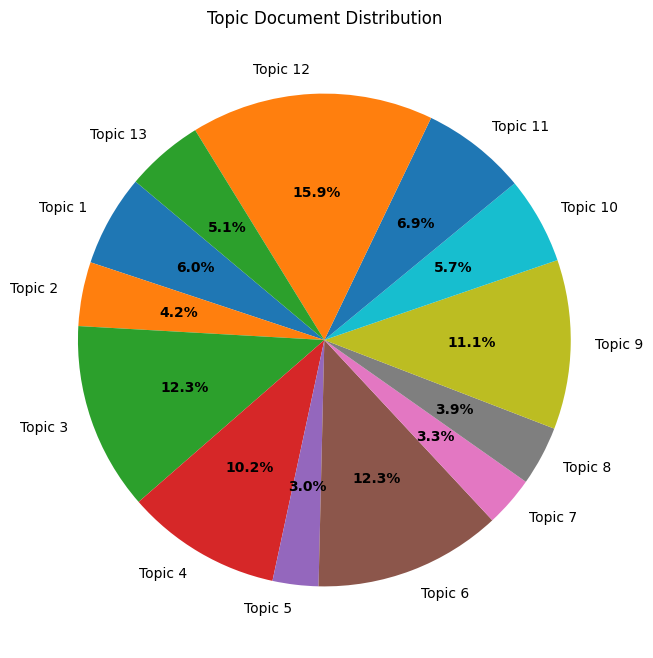

In [43]:
# 4.3 Distribution of text quantity under each topic, counting how much text there is under each topic

import numpy as np
import torch
import torch.nn as nn
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

#Find the theme to which each text belongs
topic_indices = np.argmax(X_dtm, axis=1)
print(encoded_vectors)
#Count the number of texts under each topic
unique_topics, topic_counts = np.unique(topic_indices, return_counts=True)


unique_topics_str = ["Topic " + str(i + 1) for i in unique_topics]

plt.figure(figsize=(10, 8))
wedges, texts, autotexts = plt.pie(topic_counts, labels=unique_topics_str, autopct='%1.1f%%', startangle=140)

# Setting up pie charts for better aesthetics
plt.setp(autotexts, size=10, weight="bold")
plt.title("Topic Document Distribution")


# Create a dot representing each label
legend_labels = [plt.Line2D([0], [0], marker='o', color='w', label=unique_topics_str[i], markersize=10, markerfacecolor=colors[i]) for i in range(len(unique_topics_str))]


plt.legend(handles=legend_labels, title="Topics", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
plt.show()

In [44]:
topic_indices
print(topic_indices)

# Trained LdaSeqModel model
for t in range(13):  # number topic = 13
    topic = ldaseq_model.print_topic_times(topic=t)  # Trained LdaSeqModel model
    words = topic[0]  # Obtain the words in the first time slot, you can also choose other time slots
    sorted_words = sorted(words, key=lambda x: x[1], reverse=True)[:3]  
    keywords = [word[0] for word in sorted_words]
    print(f"Top 3 keywords for Topic {t + 1}: {', '.join(keywords)}")

    



[11  8 11  0 11  3  9  3  0  8  7  7  2  2  7  8  2  3  3  2  1 11 11  9
  3 11  6  2  1 11  1  8 11  8  9  1  2  5  8 11  1  2  0  1 11  2  7  2
 11  4  8  5  6  8  3  5  8  3  3  3  3 11  6  5 12  5  8  8  0  0  4  3
  3  3  3 10  4 11 10  2 11  7 11  5  9  5  8  2  2  3  9 10 10 12  0  3
  2  2 11  2  1  8  8  8 11 11 11  8  2 11  3  6  8  9 11  0 12  8  6  7
  3  2 10  0  2 11 11 11  1  1 10  2  3  0  3  3  3  2  4 10  6  4  0  2
  3 11  2 11 11  7 11  8  2 12  9 11 11  1  7 11 11 10 10  9  2  2  3  9
  8 11  8 11  0 11  8  9  3  0  8  7 11  2  7  2  3  1 11  9 11  2  0  9
  1  2  5  8  2  0  1 11  7  3  4  8  5  6  5  0  3 11  6  0 12  5  8  8
  0  4  3  3  8  4 11 10 11  7 11  9  5  8  2  2  9 10  5  2  2  2 10  8
 11  8  0 11  6  8  9  9  4  5  8  6 11 10 11  8  3  0  3  3 10  6  0  2
  2 11  2 11  8  5  9 11 11  1  7 11 11 10 10  2  3  9  8  9  5  5  2  5
  5  5  5  8  4  5 12  5  5 10  5  5  5  5  5  5  5  5  5  5  5  5  5 12
 12 12 12 12 12 12 12 12  5  5  5 12 10  2  5 10 10

In [1]:
for t in range(13):  # 假设有13个主题
    topic = ldaseq_model.print_topic_times(topic=t)  # 获取该主题下的所有词，针对所有时间片
    words = topic[1]  # 获取第一个时间片内的词（你也可以选择其他时间片）
    sorted_words = sorted(words, key=lambda x: x[1], reverse=True)  # 对词按权重进行排序
    
    keywords = [word[0] for word in sorted_words]  # 从排序后的列表中提取关键词
    print(f"All keywords for Topic {t + 1}: {', '.join(keywords)}")


NameError: name 'ldaseq_model' is not defined

In [52]:
df2 = pd.DataFrame([df['Year of Publication']]) #year
df2 = df2.transpose() 
df3['Topic'] = pd.DataFrame(topic_indices) #topic

merged_df = pd.concat([df2, df3['Topic']], axis=1) #index_merged

print(merged_df)


     Year of Publication  Topic
0                   2014     11
1                   2018      8
2                   2008     11
3                   2020      0
4                   2015     11
..                   ...    ...
328                 2022     10
329                 2022     10
330                 2022     10
331                 2003     12
332                 2022     10

[333 rows x 2 columns]


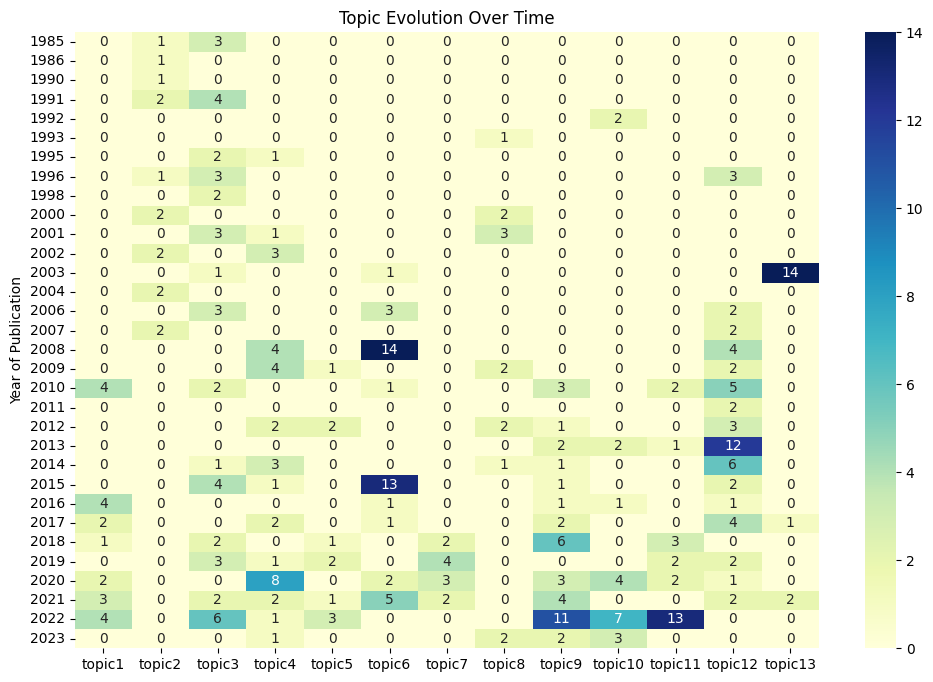

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# topic count
topic_count = merged_df.groupby(['Year of Publication', 'Topic']).size().reset_index(name='counts')

# Using pivot_ Table to create a data structure suitable for thermal diagrams
heatmap_data = pd.pivot_table(topic_count, values='counts', index='Year of Publication', columns='Topic', fill_value=0)

#Renaming a column to start from 1 instead of 0
new_columns = [f'topic{i+1}' for i in range(len(heatmap_data.columns))]
heatmap_data.columns = new_columns

# Using Seaborn to draw a thermal diagram
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, cmap='YlGnBu')
plt.title('Topic Evolution Over Time')
plt.show()


In [160]:
merged_df.sort_values('Year of Publication', inplace=True)
print(merged_df)

     Year of Publication  Topic
79                  1985      5
279                 1985      5
128                 1985      5
165                 1985      5
28                  1986      5
..                   ...    ...
187                 2023      4
182                 2023      3
54                  2023      1
23                  2023      4
168                 2023     12

[333 rows x 2 columns]


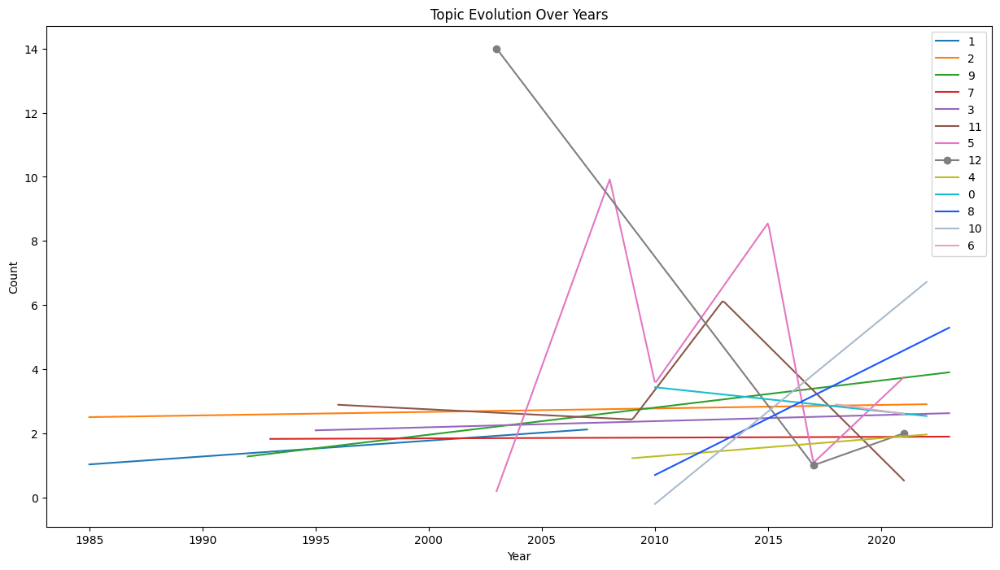

In [54]:
import pandas as pd
import numpy as np
from scipy.interpolate import UnivariateSpline
import matplotlib.pyplot as plt


# Group by year and theme, and calculate the number of each group
grouped_df = merged_df.groupby(['Year of Publication', 'Topic']).size().reset_index(name='Count')

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#1a55FF', '#aabbcc', '#ddaabb']

plt.figure(figsize=(15, 8))

# Draw a smooth curve for each theme
for idx, topic in enumerate(grouped_df['Topic'].unique()):
    topic_data = grouped_df[grouped_df['Topic'] == topic]
    
    x = topic_data['Year of Publication']
    y = topic_data['Count']
    
    # Check if there are sufficient data points
    if len(x) > 3:  # At least 4 points are required to create a 1-degree spline
        spl = UnivariateSpline(x, y, k=1,s=70.0)
        x_smooth = np.linspace(x.min(), x.max(), 300)
        y_smooth = spl(x_smooth)
        plt.plot(x_smooth, y_smooth, label=topic, color=colors[idx])
    else:
        plt.plot(x, y, label=topic, color=colors[idx], marker='o')

plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Topic Evolution Over Years')
plt.legend()
plt.show()




d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\sklearn\cluster\_kmeans

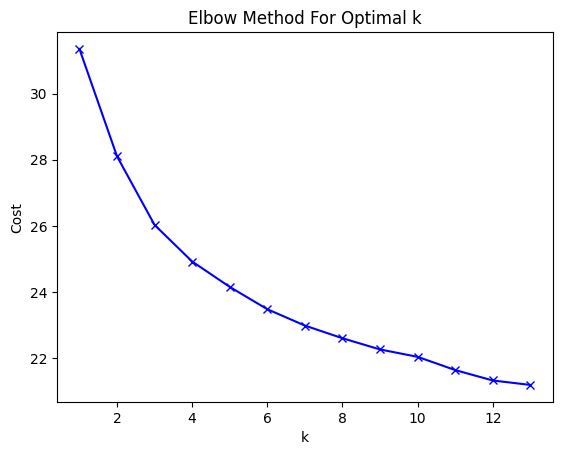

d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\sklearn\cluster\_kmeans

轮廓系数： [0.093954146, 0.09457716, 0.06612013, 0.052544516, 0.05578234, 0.05482781, 0.048312183, 0.05179557, 0.04634908, 0.04368264, 0.051457997, 0.048551634]


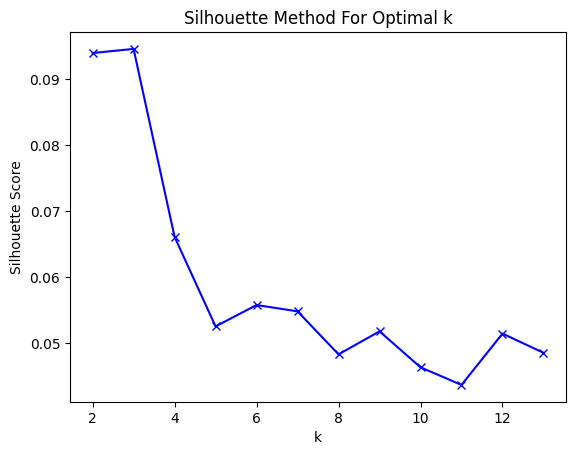

In [55]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = encoded_vectors

# elbow method
costs = []
K_range = range(1, 14)
for k in K_range:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    costs.append(kmeans.inertia_)

plt.figure()
plt.plot(K_range, costs, 'bx-')
plt.xlabel('k')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

# silhouette coefficient
silhouette_scores =[]
K_range = range(2, 14)  
for k in K_range:
    kmeans = KMeans(n_clusters=k)
    cluster_labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)
print("Silhouette Score:",silhouette_scores)
plt.figure()
plt.plot(K_range, silhouette_scores, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method For Optimal k')
plt.show()


d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


[1 1 1 1 1 1 1 0 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 0 0 0 1 1 1 0 1 1 1 0 1 1 0
 1 0 0 1 1 1 0 1 1 1 1 1 0 0 0 1 1 0 0 1 1 0 0 1 1 1 1 0 0 0 0 1 1 1 1 1 0
 0 0 1 1 1 0 1 1 1 0 1 0 0 1 1 0 0 0 1 0 0 1 1 1 0 0 1 0 0 0 1 1 1 1 0 1 0
 0 1 0 1 1 0 0 1 1 0 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 1 1 1
 1 1 1 1 1 0 0 1 0 0 1 1 1 0 0 1 1 0 1 1 0 1 0 1 0 0 1 0 0 1 1 0 0 0 0 0 0
 1 1 0 0 0 0 1 1 0 0 0 1 1 1 1 1 1 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 1 1
 1 0 1 0 0 0 0 1 1 0 1 1 0 1 0 0 1 0 1 0 1 1 1 0 0 1 1 0 0 0 1 1 1 0 0 1 0
 0 1 0 0 1 0 1 1 1 0 0 0 1 1 0 1 1 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0]
[169 164]
Cluster 0: [-6.07394636e-01  4.25756812e-01  5.07703498e-02 -1.32926792e-01
 -5.33324182e-01 -4.07811552e-02  2.55128324e-01 -4.86581214e-03
 -2.26497710e-01 -4.38647181e-01 -6.06029965e-02 -4.04767811e-01
 -2.10053418e-02  4.81015086e-01 -2.62144238e-01  3.02917540e-01
  5.13809204e-01  1.39277697e-01  1.2343284

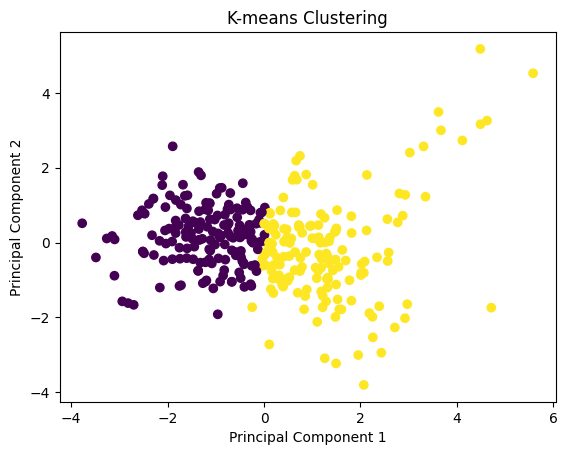

In [65]:

#4.5 Topic clustering, a visualization of the previous model
import numpy as np 
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

##Using the K-Means algorithm to encode_ Output clustering into 5 categories document_ Topic_ Prob_ Matrix
num_clusters = 2
kmeans = KMeans(n_clusters=num_clusters).fit(v_output)
labels = kmeans.labels_
print(labels)

# Count the number of texts under each cluster (topic)
cluster_document_counts = np.bincount(labels)
print(cluster_document_counts)
# Output the number of texts under each cluster (topic)
for cluster_id, count in enumerate(v_output):
    print(f"Cluster {cluster_id}: {count} documents")


#PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca_output = pca.fit_transform(v_output)

plt.scatter(pca_output[:,0], pca_output[:, 1],c = labels)
plt.title('K-means Clustering')
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()


[161 172]
Cluster 0: [-6.07394636e-01  4.25756812e-01  5.07703498e-02 -1.32926792e-01
 -5.33324182e-01 -4.07811552e-02  2.55128324e-01 -4.86581214e-03
 -2.26497710e-01 -4.38647181e-01 -6.06029965e-02 -4.04767811e-01
 -2.10053418e-02  4.81015086e-01 -2.62144238e-01  3.02917540e-01
  5.13809204e-01  1.39277697e-01  1.23432845e-01  4.62230086e-01
  8.78213122e-02  2.94313766e-04  8.03281739e-02  5.85688353e-02
  2.51439095e-01 -3.59868109e-01 -4.20700669e-01 -2.42689401e-01
  2.63165012e-02 -1.66336596e-01  9.70809162e-02  4.78237063e-01
  5.02612367e-02 -7.72436261e-02  3.25548291e-01 -5.25238395e-01
  9.24475491e-01  4.77412045e-02  6.51757538e-01  7.06867874e-03
  1.78989209e-02  5.24617732e-01  1.02070734e-01 -1.51004821e-01
  3.23217124e-01  1.04136355e-01 -3.48152518e+00 -8.25518668e-02
 -2.45843247e-01 -6.04019940e-01  4.16300088e-01 -6.66834831e-01
  4.91348296e-01  4.31342691e-01 -5.09917796e-01  4.67648774e-01
 -1.24874316e-01 -2.07444236e-01  6.31563962e-01  1.65613204e-01
  2.

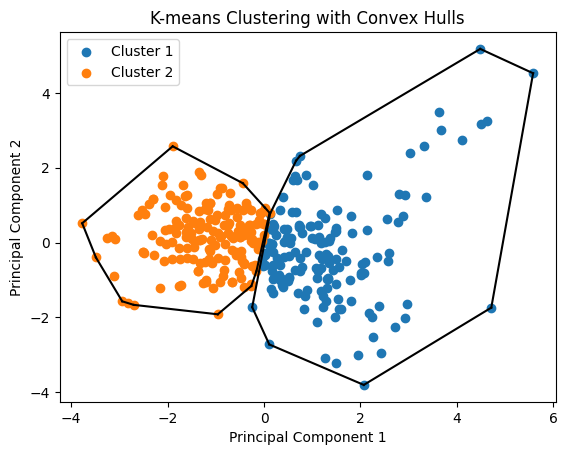

In [301]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull
import matplotlib.patches as patches


# 使用K-Means算法进行聚类
num_clusters = 2
kmeans = KMeans(n_clusters=num_clusters).fit(v_output)
labels = kmeans.labels_

# 使用PCA进行降维
pca = PCA(n_components=2)
pca_output = pca.fit_transform(v_output)

# 创建图像
plt.figure()

# 遍历每个簇，并为每个簇绘制一个凸包
for i in range(num_clusters):
    # 获取属于这个簇的点
    points = pca_output[labels == i]
    
    # 计算凸包
    hull = ConvexHull(points)
    
    # 绘制点
    plt.scatter(points[:, 0], points[:, 1], label=f'Cluster {i+1}')
    
    # 绘制凸包
    for j in hull.simplices:
        plt.plot(points[j, 0], points[j, 1], 'k-')
# 统计每个聚类簇（主题）下的文本数量
cluster_document_counts = np.bincount(labels)
print(cluster_document_counts)
# 输出每个聚类簇（主题）下的文本数量
for cluster_id, count in enumerate(v_output):
    print(f"Cluster {cluster_id}: {count} documents")

# 添加标签和标题
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-means Clustering with Convex Hulls')
plt.legend()

# 显示图像
plt.show()


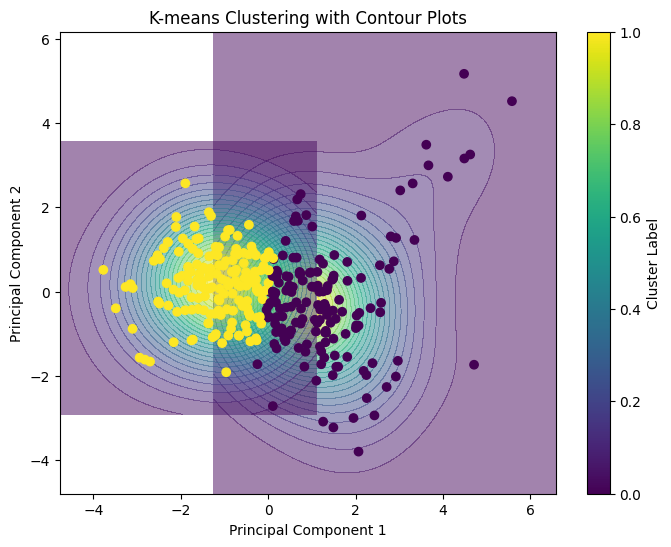

In [309]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.neighbors import KernelDensity
import matplotlib.pyplot as plt
from matplotlib import cm

num_clusters = 2
# PCA
pca = PCA(n_components=2)
v_output_reduced = pca.fit_transform(encoded_vectors)

plt.figure(figsize=(8, 6))

for i in range(num_clusters):
    # Extract the data points of this cluster
    points = v_output_reduced[labels == i]
    
    # Using Kernel Density Estimation (KDE) for density estimation of data points
    kde = KernelDensity(bandwidth=1.0, kernel='gaussian')
    kde.fit(points)
    
    # network
    x_min, x_max = points[:, 0].min() - 1, points[:, 0].max() + 1
    y_min, y_max = points[:, 1].min() - 1, points[:, 1].max() + 1
    x, y = np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100)
    X, Y = np.meshgrid(x, y)
    xy_sample = np.vstack([X.ravel(), Y.ravel()]).T
    Z = np.exp(kde.score_samples(xy_sample))
    Z = Z.reshape(X.shape)
    
    # Draw contour maps
    levels = np.linspace(Z.min(), Z.max(), 25)
    plt.contourf(X, Y, Z, levels=levels, cmap=cm.viridis, alpha=0.5)

plt.scatter(v_output_reduced[:, 0], v_output_reduced[:, 1], c=labels, cmap='viridis')
plt.title("K-means Clustering with Contour Plots")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(label='Cluster Label')
plt.show()


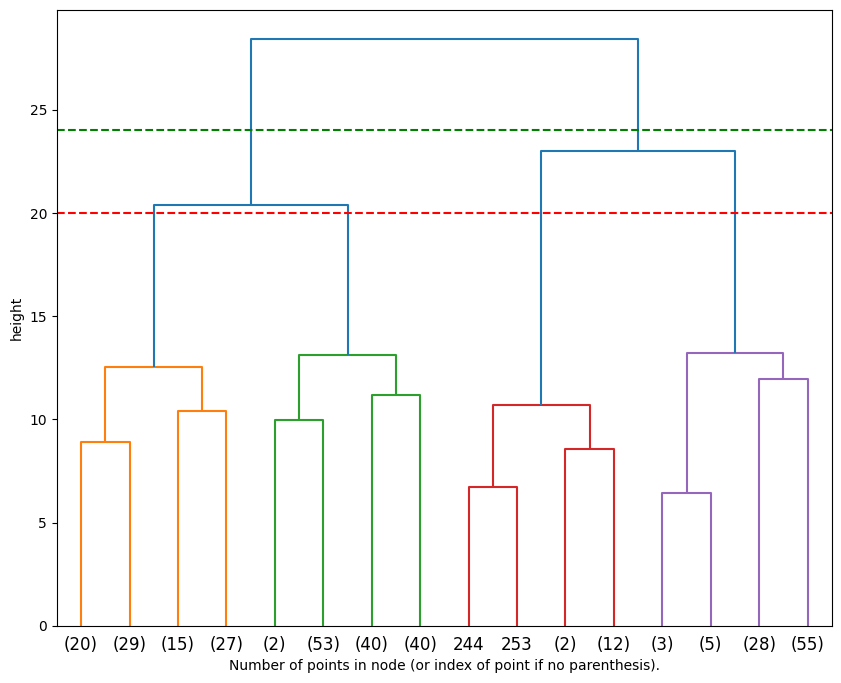

Cluster labels for each sample: [2 1 1 2 1 1 2 1 1 1 2 2 1 1 1 2 2 1 2 2 1 2 1 2 1 1 1 1 2 1 2 2 2 1 2 2 1
 2 1 1 2 2 2 1 2 2 2 1 2 2 1 1 1 1 1 1 2 2 2 1 2 1 2 2 1 1 1 1 2 1 2 1 2 1
 1 1 2 2 1 1 1 1 1 1 2 1 1 1 1 1 1 2 2 1 1 1 2 2 1 1 1 1 2 1 2 2 1 1 1 1 1
 1 2 1 1 2 1 1 2 2 2 1 1 2 1 1 1 2 2 1 2 2 2 2 1 2 1 1 2 1 1 2 1 2 1 2 1 2
 2 2 2 2 2 1 1 1 1 1 2 1 1 1 1 2 2 1 1 2 1 2 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1
 2 1 1 1 1 1 1 1 1 1 1 2 2 2 1 1 1 2 1 1 1 1 2 1 2 1 1 1 1 1 2 1 2 1 1 2 1
 1 1 1 1 1 1 1 2 2 1 2 2 1 1 1 1 1 1 2 1 2 1 2 2 1 2 2 1 1 1 1 2 1 2 1 1 1
 1 2 2 1 2 1 1 2 2 1 1 1 1 1 1 1 2 2 1 1 2 1 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1
 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Number of texts under each topic: Counter({1: 226, 2: 107})


In [57]:
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.decomposition import PCA


# Specify parameters
num_clusters = 2  
affinity = 'euclidean'  # Using Euclidean distance as a distance metric
linkage_method = 'ward'  # Using ward linkage as clustering algorithm


Z = linkage(v_output, method=linkage_method, metric=affinity)



# Dendrogram
plt.figure(figsize=(10, 8))
dendrogram(Z, truncate_mode='level', p=3)

# Add Horizontal Line
plt.axhline(y=20, color='r', linestyle='--')
plt.axhline(y=24, color='g', linestyle='--')
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.ylabel("height")
plt.show()


#Generate cluster labels from the link matrix and the specified number of clusters. 
# Return cluster labels based on the number of clusters
agg_labels = fcluster(Z, t=num_clusters, criterion='maxclust')

#Output clustering labels for each sample
print("Cluster labels for each sample:", agg_labels)
#Count the number of texts under each topic
cluster_counts = Counter(agg_labels)
print("Number of texts under each topic:", cluster_counts)




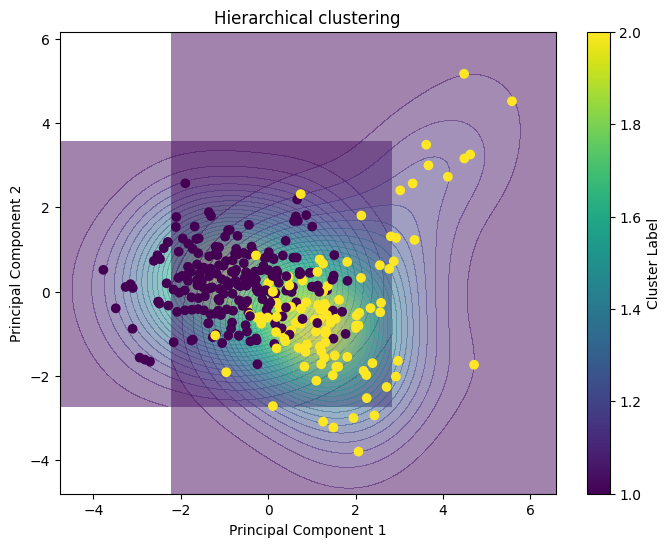

In [58]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.decomposition import PCA
from sklearn.neighbors import KernelDensity
from matplotlib import cm


pca = PCA(n_components=2)
v_output_reduced = pca.fit_transform(encoded_vectors)
num_clusters = 2
plt.figure(figsize=(8, 6))

for i in range(1, num_clusters + 1):
    # Retrieve data points from the current cluster
    points = v_output_redued[agg_labels == i]
    
    # Using Kernel Density Estimation (KDE) for density estimation of data points
    kde = KernelDensity(bandwidth=1.0, kernel='gaussian')
    kde.fit(points)
    
    
    x_min, x_max = points[:, 0].min() - 1, points[:, 0].max() + 1
    y_min, y_max = points[:, 1].min() - 1, points[:, 1].max() + 1
    x, y = np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100)
    X, Y = np.meshgrid(x, y)
    xy_sample = np.vstack([X.ravel(), Y.ravel()]).T
    Z = np.exp(kde.score_samples(xy_sample))
    Z = Z.reshape(X.shape)
    
    # Draw contour maps
    levels = np.linspace(Z.min(), Z.max(), 25)
    plt.contourf(X, Y, Z, levels=levels, cmap=cm.viridis, alpha=0.5)

plt.scatter(v_output_reduced[:, 0], v_output_reduced[:, 1], c=agg_labels, cmap='viridis')
plt.title("Hierarchical clustering")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(label='Cluster Label')
plt.show()


In [59]:
#Testing the suitability of clustering algorithms
# Calculate the evaluation indicators for K-means,Agglomerative
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# kmeans
silhouette_kmeans = silhouette_score(v_output,  kmeans.labels_)
calinski_kmeans = calinski_harabasz_score(v_output,  kmeans.labels_)

# Agglomerative
silhouette_agg = silhouette_score(v_output, agg_labels)
calinski_agg = calinski_harabasz_score(v_output, agg_labels)

print(f"K-means Silhouette Score: {silhouette_kmeans}, Agglomerative Silhouette Score: {silhouette_agg}")
print(f"K-means Calinski-Harabasz Index: {calinski_kmeans}, Agglomerative Calinski-Harabasz Index: {calinski_agg}")

# Choose the best model based on your evaluation metrics
if silhouette_kmeans > silhouette_agg and calinski_kmeans > calinski_agg:
    print("K-means performs better according to both metrics.")
elif silhouette_agg > silhouette_kmeans and calinski_agg > calinski_kmeans:
    print("Agglomerative clustering performs better according to both metrics.")
else:
    print("The two methods perform similarly or excel in different metrics. Consider your specific needs.")


K-means Silhouette Score: 0.09573400020599365, Agglomerative Silhouette Score: 0.10453349351882935
K-means Calinski-Harabasz Index: 39.84365835861647, Agglomerative Calinski-Harabasz Index: 30.518243865843697
The two methods perform similarly or excel in different metrics. Consider your specific needs.


轮廓系数（Silhouette Score）：
轮廓系数是一个用于评估聚类效果的指标，其值范围在[-1, 1]之间。对于单个数据点，它衡量了该点与其所在簇内其他点的相似度以及与其他簇的分离度。更高的轮廓系数表示数据点更好地分配到了正确的簇中。

Calinski-Harabasz Index（方差比率指标）：
Calinski-Harabasz Index，也称为方差比率指标，是一种用于评估聚类算法效果的指标。它计算了簇间的方差与簇内的方差之比，用于衡量簇的分离度。较高的方差比率指标表示簇之间的分离度更好。

轮廓图（Silhouette Plot）：
轮廓图是一种可视化工具，用于直观地显示不同簇数下轮廓系数的变化趋势。它可以帮助你选择合适的簇数，即确定数据的真实聚类数目。在轮廓图中，x轴表示轮廓系数的值，y轴表示不同簇数。理想情况下，我们希望找到一个簇数，使得轮廓系数较高且簇数不过多。

In [60]:
df['Cluster_Label'] = labels
df1 = df['Content_Part_1']
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter

def extract_keywords(texts, num_keywords=40):
    vectorizer = CountVectorizer().fit(texts)
    bag_of_words = vectorizer.transform(texts)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vectorizer.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return [word for word, freq in words_freq[:num_keywords]]

# For each cluster, extract the theme word
for cluster in set(labels):
    texts = df[df['Cluster_Label'] == cluster]['Content_Part_1']
    keywords = extract_keywords(texts)
    print(f"Cluster {cluster}: Keywords: {keywords}")


Cluster 0: Keywords: ['mediation', 'conflict', 'mediator', 'peace', 'party', 'process', 'international', 'state', 'also', 'may', 'agreement', 'one', 'actor', 'war', 'use', 'power', 'norm', 'political', 'strategy', 'study', 'dispute', 'civil', 'approach', 'make', 'peacebuilding', 'case', 'issue', 'negotiation', 'two', 'group', 'role', 'un', 'see', 'third', 'include', 'different', 'society', 'likely', 'effort', 'effect']
Cluster 1: Keywords: ['peace', 'agreement', 'international', 'conflict', 'party', 'state', 'law', 'mediation', 'process', 'right', 'also', 'legal', 'security', 'political', 'woman', 'may', 'human', 'negotiation', 'actor', 'war', 'mediator', 'one', 'provide', 'civil', 'resolution', 'power', 'use', 'make', 'un', 'include', 'society', 'group', 'government', 'case', 'form', 'would', 'role', 'new', 'however', 'issue']


In [62]:
topic1_keywords = ['peace', 'agreement', 'international', 'conflict', 'mediation', 'party', 'state', 'law', 'process', 'right', 'also', 'legal', 'security', 'political', 'woman', 'may', 'human', 'negotiation', 'mediator', 'actor', 'war', 'one', 'provide', 'civil', 'power', 'resolution', 'use', 'make', 'un', 'society', 'include', 'group', 'government', 'case', 'role', 'form', 'new', 'would', 'however', 'issue']
topic2_keywords = ['mediation', 'conflict', 'mediator', 'peace', 'party', 'process', 'international', 'state', 'also', 'may', 'agreement', 'one', 'actor', 'war', 'use', 'power', 'strategy', 'political', 'dispute', 'study', 'norm', 'civil', 'approach', 'make', 'peacebuilding', 'case', 'issue', 'negotiation', 'two', 'group', 'un', 'see', 'role', 'third', 'include', 'different', 'society', 'likely', 'effort', 'effect']

# convert to set
set1 = set(topic1_keywords)
set2 = set(topic2_keywords)

# Calculate Intersection, Difference, and Union
intersection = set1.intersection(set2)  # {"peace", "conflict"}
difference1 = set1.difference(set2)  # {"mediation", "resolution"}
difference2 = set2.difference(set1)  # {"war", "treaty"}
union = set1.union(set2)  # {"peace", "mediation", "conflict", "resolution", "war", "treaty"}

print("Common keywords:", intersection)
print("Unique to topic1:", difference1)
print("Unique to topic2:", difference2)
print("All keywords:", union)


Common keywords: {'society', 'case', 'power', 'make', 'also', 'actor', 'mediation', 'mediator', 'party', 'negotiation', 'agreement', 'one', 'issue', 'peace', 'conflict', 'un', 'process', 'include', 'political', 'use', 'group', 'war', 'civil', 'may', 'state', 'international', 'role'}
Unique to topic1: {'provide', 'woman', 'would', 'security', 'resolution', 'legal', 'new', 'form', 'government', 'human', 'right', 'law', 'however'}
Unique to topic2: {'likely', 'study', 'third', 'peacebuilding', 'see', 'different', 'effect', 'approach', 'dispute', 'effort', 'two', 'strategy', 'norm'}
All keywords: {'study', 'power', 'actor', 'approach', 'mediation', 'provide', 'party', 'negotiation', 'agreement', 'effect', 'issue', 'peace', 'two', 'norm', 'likely', 'law', 'conflict', 'effort', 'political', 'include', 'use', 'war', 'civil', 'may', 'form', 'international', 'new', 'society', 'case', 'make', 'also', 'however', 'mediator', 'peacebuilding', 'different', 'resolution', 'legal', 'one', 'human', 'str

In [63]:
# 获取每个聚类簇的特征向量
cluster_feature_vectors = []  # 用于存储每个聚类簇的特征向量

for cluster_id in range(num_clusters):
    cluster_samples_indices = np.where(labels == cluster_id)[0]  # 获取属于该簇的样本索引
    cluster_samples_features = combined_vectors[cluster_samples_indices]  # 获取属于该簇的样本特征向量
    cluster_feature_vector = np.mean(cluster_samples_features, axis=0)  # 计算特征向量的平均值
    cluster_feature_vectors.append(cluster_feature_vector)

# cluster_feature_vectors 现在包含每个聚类簇的特征向量
for cluster_id, feature_vector in enumerate(cluster_feature_vectors):
    print(f"Cluster {cluster_id} Feature Vector:", feature_vector)


Cluster 0 Feature Vector: [-0.38944253 -0.43896672 -1.6617297  -0.54966456 -0.9495128   0.6755517
  0.02129492 -0.3187917  -1.7384216   1.1528598  -1.4738996  -0.4395905
 -0.16516496 -0.42205188 -2.7995718  -0.5199867   0.24100912 -0.09337257
  0.3945775  -1.7112244  -1.0365045  -0.16274458  0.05790158  0.55321836
  0.33823362  0.32719567  0.764478    1.073045    0.4840785  -0.4133974
  0.89469814 -0.6234665 ]
Cluster 1 Feature Vector: [-4.1484720e-01 -7.9307747e-01 -1.0806848e+00 -2.5535169e-01
 -1.0960966e+00  6.1299443e-01  9.2081539e-02 -6.7770076e-01
 -1.2871863e+00  6.1738414e-01 -1.2850448e+00 -2.6444423e-01
 -2.6396209e-01 -2.9023340e-01 -2.8356116e+00 -3.8697892e-01
  2.6981592e-01  4.2450461e-01  2.6343590e-01 -1.6904171e+00
 -8.8286161e-01 -4.7725830e-02 -3.8155377e-01  6.5319717e-01
  1.2154452e-03  4.1079575e-01  8.1738138e-01  1.2093959e+00
  1.0025604e+00 -2.9662144e-01  1.0439209e+00 -2.9083058e-01]


5.主题词共现网络分析

In [ ]:
#5.1获取DTM每个阶段关键词
#识别第一阶段的研究主题,获取前16个主题词
ldaseq_model.print_topics(time = 0,top_terms=16)

[[('society', 0.03904050543514792),
  ('civil', 0.038640298515296455),
  ('peace', 0.026987626056246078),
  ('negotiation', 0.023768926573228908),
  ('group', 0.020715880082381143),
  ('party', 0.011614814605270748),
  ('agreement', 0.009734541525580452),
  ('may', 0.009609599120405814),
  ('conflict', 0.009389443140535013),
  ('process', 0.008304489174796674),
  ('political', 0.0075746848854620205),
  ('table', 0.006888296987096012),
  ('also', 0.006246887545075509),
  ('role', 0.0060335018963427),
  ('democratic', 0.0057962923667375914),
  ('elite', 0.005287272946450609)],
 [('peace', 0.0383945554336876),
  ('conflict', 0.03716800501762098),
  ('study', 0.03518215798106045),
  ('article', 0.024338744660101528),
  ('citation', 0.012001292443567029),
  ('journal', 0.011756409594552153),
  ('cluster', 0.010109546297675324),
  ('scholar', 0.008027368033970679),
  ('topic', 0.0073508849927801856),
  ('cod', 0.00706738804394974),
  ('war', 0.007053573476963158),
  ('number', 0.006835338835

In [ ]:
print('corpusTopic = ldaseq.print_topics(time=0)')
corpusTopic = ldaseq_model.print_topics(time=0)  # 输出指定时期主题分布，此处第一个时期主题分
print(ldaseq_model.print_topics(time=0))
print('='*50)
print('词料库主题')
print(corpusTopic)

topicEvolution = ldaseq_model.print_topic_times(topic=0) # 查询指定主题在不同时期的演变，此处为第一个主题的
print('='*50)
print('主题的在不同时期演变')
print(ldaseq_model.print_topic_times(topic=0))
print(ldaseq_model.print_topic_times(topic=1))
print(ldaseq_model.print_topic_times(topic=2))


corpusTopic = ldaseq.print_topics(time=0)
[[('society', 0.03904050543514792), ('civil', 0.038640298515296455), ('peace', 0.026987626056246078), ('negotiation', 0.023768926573228908), ('group', 0.020715880082381143), ('party', 0.011614814605270748), ('agreement', 0.009734541525580452), ('may', 0.009609599120405814), ('conflict', 0.009389443140535013), ('process', 0.008304489174796674), ('political', 0.0075746848854620205), ('table', 0.006888296987096012), ('also', 0.006246887545075509), ('role', 0.0060335018963427), ('democratic', 0.0057962923667375914), ('elite', 0.005287272946450609), ('participation', 0.004773515509075849), ('state', 0.004736085810185855), ('international', 0.0047244128545993105), ('value', 0.004676218709353633)], [('peace', 0.0383945554336876), ('conflict', 0.03716800501762098), ('study', 0.03518215798106045), ('article', 0.024338744660101528), ('citation', 0.012001292443567029), ('journal', 0.011756409594552153), ('cluster', 0.010109546297675324), ('scholar', 0.008

In [ ]:
#5.2获取每篇文档的主题词
##转换格式
W_sum = []
for word in Clean_Words:
    Sum_W = ""
    for w in word:
        Sum_W += (w + "")
    W_sum.append(Sum_W)
W_sum

In [ ]:
#5.3每个阶段关键词共现矩阵
vocabs, co_occ = create_cooccurrence_matrix(W_sum)

df_co_occ = pd.DataFrame(co_occ.todense(),
                         index = vocabs.keys(),
                         columns= = vocabs.keys())

df_co_occ = df_co_occ.sort_index()[sorted(vocabs.keys())]
df_co_occ.style.applymap(lambda x:'color:red' if x > 0 else '')  


In [ ]:
#5.4 关键词共现网络绘制

#### BERTopic

In [212]:
#BERTopic
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic.vectorizers import ClassTfidfTransformer


d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
d:\software\computer\anaconda3\envs\BERTopic_Env\lib\site-packag

In [213]:
#Embeddings  [sentence-transformers/]
# Step 1 - Extract embeddings
embedding_model = SentenceTransformer('all-MiniLM-L6-v2')
# Step 2 - Reduce dimensionalityn 
umap_model = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine',random_state=2020)
# 3 clustering
hdbscan_model = HDBSCAN(min_cluster_size=10, metric='euclidean', cluster_selection_method='eom', prediction_data=True)
# 4 tokeinzer
from sklearn.feature_extraction.text import CountVectorizer
vectorizer_model = CountVectorizer(ngram_range=(1, 3),stop_words="english")
#  5 - Create topic representation
ctfidf_model = ClassTfidfTransformer()
# Step 6 - (Optional) Fine-tune topic representations with 
# a 'bertopic.representation' model
from bertopic.representation import MaximalMarginalRelevance
from bertopic import BERTopic
# Create your representation model
representation_model = MaximalMarginalRelevance(diversity=0.3)

topic_model = BERTopic(
    embedding_model=embedding_model,    # Step 1 - Extract embeddings
    umap_model=umap_model,              # Step 2 - Reduce dimensionality
    hdbscan_model=hdbscan_model,        # Step 3 - Cluster reduced embeddings
    vectorizer_model=vectorizer_model,  # Step 4 - Tokenize topics
    ctfidf_model=ctfidf_model,          # Step 5 - Extract topic words
    nr_topics=10, 
    representation_model=representation_model # Step 6 - (Optional) Fine-tune topic represenations                      
)




In [214]:
# Step 2 - Reduce dimensionalityn 
umap_model = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine',random_state=2020)


In [215]:
#3.3 clustering
hdbscan_model = HDBSCAN(min_cluster_size=10, metric='euclidean', cluster_selection_method='eom', prediction_data=True)


In [216]:
#3.4 tokeinzer
from sklearn.feature_extraction.text import CountVectorizer
vectorizer_model = CountVectorizer(ngram_range=(1, 3),stop_words="english")


In [217]:
# Step 5 - Create topic representation
ctfidf_model = ClassTfidfTransformer()


In [218]:
# Step 6 - (Optional) Fine-tune topic representations with 
# a 'bertopic.representation' model
from bertopic.representation import MaximalMarginalRelevance
from bertopic import BERTopic

# Create your representation model
representation_model = MaximalMarginalRelevance(diversity=0.3)






In [219]:
#训练模型
topic_model = BERTopic(
    embedding_model=embedding_model,    # Step 1 - Extract embeddings
    umap_model=umap_model,              # Step 2 - Reduce dimensionality
    hdbscan_model=hdbscan_model,        # Step 3 - Cluster reduced embeddings
    vectorizer_model=vectorizer_model,  # Step 4 - Tokenize topics
    ctfidf_model=ctfidf_model,          # Step 5 - Extract topic words
    nr_topics=10, 
    representation_model=representation_model # Step 6 - (Optional) Fine-tune topic represenations                      
)



In [220]:
import pandas as pd
import re

# 读取数据集
csv_file = "f:/durham/MDS/Project/dataset_test1.csv"
df = pd.read_csv(csv_file, low_memory=False)

# 定义正则表达式模式匹配数字
pattern = r'\d+'

# 对数据集中的每个元素应用正则表达式替换
for col in df.columns:
    if df[col].dtype == 'object':
        df[col] = df[col].apply(lambda x: re.sub(pattern, '', str(x)))

# 打印处理后的数据集
#print(df.head())
#检查每个元素是否包含数字
df1 = df['Content_Part_1']
print(df1)


0      abstract purpose rapidly expand body literatur...
1      abstractscholars field peace conflict study lo...
2      abstractmediation compete short longterm effec...
3      abstractas contemporary arm conflict become in...
4      abstractculture feature prominently literature...
                             ...                        
328    forwardlooking build culture diversity equal c...
329    country credible verifiable information  secur...
330    become widely accepted usage range instrument ...
331    fail ec become replaced un peace keep role pea...
332    incompatible stabilization goalsfootnotein lig...
Name: Content_Part_1, Length: 333, dtype: object


In [221]:
for col in df.columns:
    print(f"Column '{col}': Data Type - {df[col].dtype}")


Column 'File Name': Data Type - object
Column 'Article Name': Data Type - object
Column 'Year of Publication': Data Type - int64
Column 'Content_Part_1': Data Type - object
Column 'Content_Part_2': Data Type - object
Column 'Content_Part_3': Data Type - object
Column 'Content_Part_4': Data Type - object
Column 'Content_Part_5': Data Type - object
Column 'Content_Part_6': Data Type - object
Column 'Content_Part_7': Data Type - object
Column 'Content_Part_8': Data Type - object
Column 'Content_Part_9': Data Type - object
Column 'Content_Part_10': Data Type - object
Column 'Content_Part_11': Data Type - object
Column 'Content_Part_12': Data Type - object
Column 'Content_Part_13': Data Type - object
Column 'Content_Part_14': Data Type - object
Column 'Content_Part_15': Data Type - object
Column 'Content_Part_16': Data Type - object


In [ ]:
for col in df.columns:
    if df[col].dtype == 'float':
        df[col] = df[col].astype(str)


In [222]:
topics, probabilities = topic_model.fit_transform(df['Content_Part_1'])


In [223]:
#topics, probabilities = topic_model.fit_transform(df1)
topic_model.get_document_info(df['Content_Part_1'])


,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,abstract purpose rapidly expand body literatur...,1,1_conflict_peace_mediation_international,"[conflict, peace, mediation, international, pr...",[whatever need may shall best accommodate sign...,conflict - peace - mediation - international -...,1.000000,False
1,abstractscholars field peace conflict study lo...,1,1_conflict_peace_mediation_international,"[conflict, peace, mediation, international, pr...",[whatever need may shall best accommodate sign...,conflict - peace - mediation - international -...,1.000000,False
2,abstractmediation compete short longterm effec...,1,1_conflict_peace_mediation_international,"[conflict, peace, mediation, international, pr...",[whatever need may shall best accommodate sign...,conflict - peace - mediation - international -...,1.000000,False
3,abstractas contemporary arm conflict become in...,1,1_conflict_peace_mediation_international,"[conflict, peace, mediation, international, pr...",[whatever need may shall best accommodate sign...,conflict - peace - mediation - international -...,1.000000,False
4,abstractculture feature prominently literature...,1,1_conflict_peace_mediation_international,"[conflict, peace, mediation, international, pr...",[whatever need may shall best accommodate sign...,conflict - peace - mediation - international -...,1.000000,False
...,...,...,...,...,...,...,...,...
328,forwardlooking build culture diversity equal c...,0,0_gender_peace_womens_conflict,"[gender, peace, womens, conflict, mediation, s...",[forwardlooking build culture diversity equal ...,gender - peace - womens - conflict - mediation...,1.000000,True
329,country credible verifiable information secur...,0,0_gender_peace_womens_conflict,"[gender, peace, womens, conflict, mediation, s...",[forwardlooking build culture diversity equal ...,gender - peace - womens - conflict - mediation...,0.871305,False
330,become widely accepted usage range instrument ...,0,0_gender_peace_womens_conflict,"[gender, peace, womens, conflict, mediation, s...",[forwardlooking build culture diversity equal ...,gender - peace - womens - conflict - mediation...,0.939157,False
331,fail ec become replaced un peace keep role pea...,1,1_conflict_peace_mediation_international,"[conflict, peace, mediation, international, pr...",[whatever need may shall best accommodate sign...,conflict - peace - mediation - international -...,0.940568,False


In [224]:
topic_model.get_topic_freq()

,Topic,Count
0,1,302
1,0,30
2,-1,1


In [312]:
topic_model.get_topic(1)

[('conflict', 0.019365887883675232),
 ('peace', 0.018896754731144348),
 ('mediation', 0.018745603725818696),
 ('international', 0.014236461236081856),
 ('process', 0.011095552708642665),
 ('peace agreement', 0.0071928498212912835),
 ('negotiation', 0.006555173834097519),
 ('civil', 0.006258120366455903),
 ('security', 0.005414603133584348),
 ('role', 0.005315176176825339)]

In [226]:
topic_model.visualize_barchart()
#5.4Heatmap
#Based on the cosine similarity matrix between topic embeddings, a heat map was created to display the similarity between topics.
topic_model.visualize_heatmap()
#Plotly allows us to display the frequency of theme changes over time, while also providing the option to hover the mouse over a point to display a representation of a specific time theme
timestamps = df['Year of Publication'].to_list()
topics_over_time = topic_model.topics_over_time(df['Content_Part_1'], timestamps)
topic_model.visualize_topics_over_time(topics_over_time, topics=[0, 1])

In [313]:
#5.2 在 2D 中可视化文档及其主题
embeddings = embedding_model.encode(df['Content_Part_1'], show_progress_bar=False)

# Run the visualization with the original embeddings
topic_model.visualize_documents(df['Article Name'], embeddings=embeddings)


In [ ]:
#5.3 Hierarchy Topics
#基于主题嵌入之间的余弦距离矩阵执行层次聚类。
topic_model.visualize_hierarchy()



In [ ]:
# Extract hierarchical topics and their representations
hierarchical_topics = topic_model.hierarchical_topics(df['Content_Part_1'])

# Visualize these representations
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)


100%|██████████| 1/1 [00:00<00:00, 66.77it/s]


In [ ]:
#5.4Heatmap
#Based on the cosine similarity matrix between topic embeddings, a heat map was created to display the similarity between topics.
topic_model.visualize_heatmap()
#Plotly allows us to display the frequency of theme changes over time, while also providing the option to hover the mouse over a point to display a representation of a specific time theme
timestamps = df['Year of Publication'].to_list()
topics_over_time = topic_model.topics_over_time(df['Content_Part_1'], timestamps)
topic_model.visualize_topics_over_time(topics_over_time, topics=[0, 1])

In [ ]:
#5.5 Term Score Decline
#每个主题都由一组单词表示。然而，这些词以不同的权重来代表主题。
#本可视化方法显示了需要多少单词来表示一个主题，以及随着单词的添加，增益在什么时候开始下降。
topic_model.visualize_term_rank()


In [314]:
#Plotly allows us to display the frequency of theme changes over time, while also providing the option to hover the mouse over a point to display a representation of a specific time theme
timestamps = df['Year of Publication'].to_list()
topics_over_time = topic_model.topics_over_time(df['Content_Part_1'], timestamps)
topic_model.visualize_topics_over_time(topics_over_time, topics=[0, 1])


In [321]:
documents = pd.DataFrame({"Document": df['Content_Part_1'],
                          "ID": range(len(df['Content_Part_1'])),
                          "Topic": topics})


[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0]

In [323]:
documents_per_topic = documents.groupby(['Topic'], as_index=False).agg({'Document': ' '.join})
documents_per_topic


,Topic,Document
0,-1,abstracttypologies wellestablished analytic to...
1,0,abstractwhat peace mean todays world endless w...
2,1,abstract purpose rapidly expand body literatur...


In [325]:
cleaned_docs = topic_model._preprocess_text(documents_per_topic.Document.values)
# Extract vectorizer and analyzer from BERTopic
vectorizer = topic_model.vectorizer_model
analyzer = vectorizer.build_analyzer()


In [327]:
# Extract features for Topic Coherence evaluation
words = vectorizer.get_feature_names_out()

tokens = [analyzer(doc) for doc in cleaned_docs]

dictionary = corpora.Dictionary(tokens)

corpus = [dictionary.doc2bow(token) for token in tokens]

topic_words = [[words for words, _ in topic_model.get_topic(topic)] for topic in range(len(set(topics))-1)]


In [328]:
topic_words

[['gender',
  'peace',
  'womens',
  'conflict',
  'mediation',
  'sexual violence',
  'feminist',
  'wps agenda',
  'security council',
  'peace security'],
 ['conflict',
  'peace',
  'mediation',
  'international',
  'process',
  'peace agreement',
  'negotiation',
  'civil',
  'security',
  'role']]

In [329]:
#remove null string
a = []
for i in range(len(topic_words)):
    b = []
    for word in topic_words[i]:
        if word != '':
            b.append(word)
    a.append(b)
    
topic_words = a
topic_words


[['gender',
  'peace',
  'womens',
  'conflict',
  'mediation',
  'sexual violence',
  'feminist',
  'wps agenda',
  'security council',
  'peace security'],
 ['conflict',
  'peace',
  'mediation',
  'international',
  'process',
  'peace agreement',
  'negotiation',
  'civil',
  'security',
  'role']]

In [330]:
# Evaluate
coherence_model = CoherenceModel(topics=topic_words, 
                                 texts=tokens, 
                                 corpus=corpus,
                                 dictionary=dictionary, 
                                 coherence='c_v')
                                 
coherence = coherence_model.get_coherence()

print(coherence)
